# Tropical Cyclone Serverity Predicion Project
## Introduction 

### Project Context
Cyclones are powerful atmospheric phenomena that can cause severe destruction, loss of life, and significant economic damage. Accurate predictions of cyclone intensity are crucial because they help:

* Warn populations in advance, reducing casualties and property damage.
* Optimize emergency response measures, such as evacuations and infrastructure protection.
* Support insurance companies in risk assessment and disaster planning.
* Assist governments and organizations in making strategic decisions.


### Key Objectives
- Identify the key factors that influence cyclone strength
- Develop a model to predict cyclone intensity levels.


The ***main goal*** of the following project is to create a model that predicts the severity of a tropical cyclone. We will use the data from the International Best Track Archive for Climate Stewardship (IBTrACS) and its geographical input features to train the model. More detailed description can be found in [documentation](https://www.ncei.noaa.gov/sites/g/files/anmtlf171/files/2024-07/IBTrACS_version4r01_Technical_Details.pdf).
The model's output should be a prediction for the values within the "TD9636_STAGE" column.

The IBTrACS is a global database that complies historical and recent tropical cyclone data from various agencies worldwide.The variables includes key information like : location (latitude and longitude), intensity (wind speed and central pressure and size and structure (radius of maximum winds).


1. [Understanding the Dataset ](#1-understanding-the-dataset)
2. [Data Preparation and Preprocessing](#2-data-preparation-and-preprocessing)
    - [Data Type Change](#21-data-type-change)
    - [Descriptive Statistics of the Pre-Selected Columns](#22--descriptive-statistics-of-the-pre-selected-columns)
    - [Filling Missing Values in WMO_WIND and WMO_PRESSURE ](#15-filling-missing-values-in-wmo_wind-and-wmo_pressure)
3. [Exploratory Data Analysis](#3-exploratory-data-analysis):
    - [Correlation Analysis of Features](#31-correlation-analysis-of-features)
    - [Storm Distribution Over Time and Visualisation](#32-storm-distribution-over-time-and-visualisation)
4. [Feature Engineering](#2-feature-engineering-and-encoding-of-the-non-numerical-columns)
5. [Model Selection, Comparison, and Evaluation](#5-trying-a-model)
    - [Logistic Regression](#51-logistic-regression-model)
    - [Decision Tree](#52-decision-tree-model)
    - [Random Forest](#53-trying-the-random-forest-model)
6. [Key Findings](#6-key-findings)

## 1. Understanding the Dataset 

### 1.1. Libraries Import and Data Loading

In [140]:
#Data Processing
import pandas as pd
import numpy as np
import scipy.stats as stats
from scipy.stats import f_oneway

from datetime import datetime

#Data Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

#Geographic Visualization
import folium
from folium import plugins
from folium.plugins import MarkerCluster

#Handling Class Imbalance
from imblearn.over_sampling import SMOTE

#Machine Learning Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import StandardScaler

#Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

#Model Evaluation Metrics
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix

In [142]:
df = pd.read_csv(
    "C:/Users/Administrateur/Documents/Applied Master of Science in Data Analytics - DSTI 2024-2025/ML/Project 3/ibtracs.csv",
    low_memory=False,
    na_values=[],  # Do not treat any values as NaN
    keep_default_na=False  # Disable default missing value interpretation (to keep "NA" as North Atlantic)
)
#"C:/Users/Lilas/OneDrive/Bureau/DSTI/machine_learning_python/project/ibtracs.csv"
#"/Users/oksana/Documents/University/Project 5/ibtracs.csv"

In [143]:
pd.set_option('display.max_columns', None)
df.head(5)

,SID,SEASON,NUMBER,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,WMO_WIND,WMO_PRES,WMO_AGENCY,TRACK_TYPE,DIST2LAND,LANDFALL,IFLAG,USA_AGENCY,USA_ATCF_ID,USA_LAT,USA_LON,USA_RECORD,USA_STATUS,USA_WIND,USA_PRES,USA_SSHS,USA_R34_NE,USA_R34_SE,USA_R34_SW,USA_R34_NW,USA_R50_NE,USA_R50_SE,USA_R50_SW,USA_R50_NW,USA_R64_NE,USA_R64_SE,USA_R64_SW,USA_R64_NW,USA_POCI,USA_ROCI,USA_RMW,USA_EYE,TOKYO_LAT,TOKYO_LON,TOKYO_GRADE,TOKYO_WIND,TOKYO_PRES,TOKYO_R50_DIR,TOKYO_R50_LONG,TOKYO_R50_SHORT,TOKYO_R30_DIR,TOKYO_R30_LONG,TOKYO_R30_SHORT,TOKYO_LAND,CMA_LAT,CMA_LON,CMA_CAT,CMA_WIND,CMA_PRES,HKO_LAT,HKO_LON,HKO_CAT,HKO_WIND,HKO_PRES,KMA_LAT,KMA_LON,KMA_CAT,KMA_WIND,KMA_PRES,KMA_R50_DIR,KMA_R50_LONG,KMA_R50_SHORT,KMA_R30_DIR,KMA_R30_LONG,KMA_R30_SHORT,NEWDELHI_LAT,NEWDELHI_LON,NEWDELHI_GRADE,NEWDELHI_WIND,NEWDELHI_PRES,NEWDELHI_CI,NEWDELHI_DP,NEWDELHI_POCI,REUNION_LAT,REUNION_LON,REUNION_TYPE,REUNION_WIND,REUNION_PRES,REUNION_TNUM,REUNION_CI,REUNION_RMW,REUNION_R34_NE,REUNION_R34_SE,REUNION_R34_SW,REUNION_R34_NW,REUNION_R50_NE,REUNION_R50_SE,REUNION_R50_SW,REUNION_R50_NW,REUNION_R64_NE,REUNION_R64_SE,REUNION_R64_SW,REUNION_R64_NW,BOM_LAT,BOM_LON,BOM_TYPE,BOM_WIND,BOM_PRES,BOM_TNUM,BOM_CI,BOM_RMW,BOM_R34_NE,BOM_R34_SE,BOM_R34_SW,BOM_R34_NW,BOM_R50_NE,BOM_R50_SE,BOM_R50_SW,BOM_R50_NW,BOM_R64_NE,BOM_R64_SE,BOM_R64_SW,BOM_R64_NW,BOM_ROCI,BOM_POCI,BOM_EYE,BOM_POS_METHOD,BOM_PRES_METHOD,NADI_LAT,NADI_LON,NADI_CAT,NADI_WIND,NADI_PRES,WELLINGTON_LAT,WELLINGTON_LON,WELLINGTON_WIND,WELLINGTON_PRES,DS824_LAT,DS824_LON,DS824_STAGE,DS824_WIND,DS824_PRES,TD9636_LAT,TD9636_LON,TD9636_STAGE,TD9636_WIND,TD9636_PRES,TD9635_LAT,TD9635_LON,TD9635_WIND,TD9635_PRES,TD9635_ROCI,NEUMANN_LAT,NEUMANN_LON,NEUMANN_CLASS,NEUMANN_WIND,NEUMANN_PRES,MLC_LAT,MLC_LON,MLC_CLASS,MLC_WIND,MLC_PRES,USA_GUST,BOM_GUST,BOM_GUST_PER,REUNION_GUST,REUNION_GUST_PER,USA_SEAHGT,USA_SEARAD_NE,USA_SEARAD_SE,USA_SEARAD_SW,USA_SEARAD_NW,STORM_SPEED,STORM_DIR
0,,Year,,,,,,,degrees_north,degrees_east,kts,mb,,,km,km,,,,degrees_north,degrees_east,,,kts,mb,1,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,mb,nmile,nmile,nmile,degrees_north,degrees_east,1,kts,mb,,nmile,nmile,,nmile,nmile,1,degrees_north,degrees_east,1,kts,mb,degrees_north,degrees_east,,kts,mb,degrees_north,degrees_east,,kts,mb,,nmile,nmile,,nmile,nmile,degrees_north,degrees_east,,kts,mb,1,mb,mb,degrees_north,degrees_east,,kts,mb,1,1,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,degrees_north,degrees_east,,kts,mb,1,1,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,nmile,mb,nmile,,,degrees_north,degrees_east,1,kts,mb,degrees_north,degrees_east,kts,mb,degrees_north,degrees_east,,kts,mb,degrees_north,degrees_east,,kts,mb,degrees_north,degrees_east,kts,mb,nmile,degrees_north,degrees_east,,kts,mb,degrees_north,degrees_east,,kts,mb,kts,kts,second,kts,second,ft,nmile,nmile,nmile,nmile,kts,degrees
1,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 00:00:00,TS,-12.5,172.5,,,,main,647,647,O_________OO_O_,jtwc_sh,SH051980,-12.5,172.5,,,25,,-1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,-12.5,172.5,TC,25,,-12.5,172.5,1,25,,,,,,,-12.5,172.5,TC,25,,,,,,,,,,,,,,,,,6,350
2,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 03:00:00,TS,-12.2,172.4,,,,main,653,653,P_________PP_P_,,SH051980,-12.2,172.4,,,25,,-1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,-12.2,172.4,TC,25,,-12.2,172.5,1,,,,,,,,-12.2,172.4,TC,25,,,,,,,,,,,,,,,,,6,350
3,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 06:00:00,TS,-11.9,172.4,,,,main,670,670,O_________OP_O_,jtwc_sh,SH051980,-11.9,172.4,,,25,,-1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,-11.9,172.4,TC,25,,-12.0,172.4,1,,,,,,,,-11.9,172.4,TC,25,,,,,,,,,,,,,,,,,5,360
4,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 09:00:00,TS,-11.7,172.4,,,,main,682,682,P_________PP_P

As indicated by the message displayed after importing the dataset, columns 1, 2, 8, 9, 14, 19, 20, 172, and 173 have mixed types. This is due to the column descriptions provided in the first row. Then, the row with index 0 can be deleted.

In [145]:
df = df.drop(0)
df.head(3)

,SID,SEASON,NUMBER,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,WMO_WIND,WMO_PRES,WMO_AGENCY,TRACK_TYPE,DIST2LAND,LANDFALL,IFLAG,USA_AGENCY,USA_ATCF_ID,USA_LAT,USA_LON,USA_RECORD,USA_STATUS,USA_WIND,USA_PRES,USA_SSHS,USA_R34_NE,USA_R34_SE,USA_R34_SW,USA_R34_NW,USA_R50_NE,USA_R50_SE,USA_R50_SW,USA_R50_NW,USA_R64_NE,USA_R64_SE,USA_R64_SW,USA_R64_NW,USA_POCI,USA_ROCI,USA_RMW,USA_EYE,TOKYO_LAT,TOKYO_LON,TOKYO_GRADE,TOKYO_WIND,TOKYO_PRES,TOKYO_R50_DIR,TOKYO_R50_LONG,TOKYO_R50_SHORT,TOKYO_R30_DIR,TOKYO_R30_LONG,TOKYO_R30_SHORT,TOKYO_LAND,CMA_LAT,CMA_LON,CMA_CAT,CMA_WIND,CMA_PRES,HKO_LAT,HKO_LON,HKO_CAT,HKO_WIND,HKO_PRES,KMA_LAT,KMA_LON,KMA_CAT,KMA_WIND,KMA_PRES,KMA_R50_DIR,KMA_R50_LONG,KMA_R50_SHORT,KMA_R30_DIR,KMA_R30_LONG,KMA_R30_SHORT,NEWDELHI_LAT,NEWDELHI_LON,NEWDELHI_GRADE,NEWDELHI_WIND,NEWDELHI_PRES,NEWDELHI_CI,NEWDELHI_DP,NEWDELHI_POCI,REUNION_LAT,REUNION_LON,REUNION_TYPE,REUNION_WIND,REUNION_PRES,REUNION_TNUM,REUNION_CI,REUNION_RMW,REUNION_R34_NE,REUNION_R34_SE,REUNION_R34_SW,REUNION_R34_NW,REUNION_R50_NE,REUNION_R50_SE,REUNION_R50_SW,REUNION_R50_NW,REUNION_R64_NE,REUNION_R64_SE,REUNION_R64_SW,REUNION_R64_NW,BOM_LAT,BOM_LON,BOM_TYPE,BOM_WIND,BOM_PRES,BOM_TNUM,BOM_CI,BOM_RMW,BOM_R34_NE,BOM_R34_SE,BOM_R34_SW,BOM_R34_NW,BOM_R50_NE,BOM_R50_SE,BOM_R50_SW,BOM_R50_NW,BOM_R64_NE,BOM_R64_SE,BOM_R64_SW,BOM_R64_NW,BOM_ROCI,BOM_POCI,BOM_EYE,BOM_POS_METHOD,BOM_PRES_METHOD,NADI_LAT,NADI_LON,NADI_CAT,NADI_WIND,NADI_PRES,WELLINGTON_LAT,WELLINGTON_LON,WELLINGTON_WIND,WELLINGTON_PRES,DS824_LAT,DS824_LON,DS824_STAGE,DS824_WIND,DS824_PRES,TD9636_LAT,TD9636_LON,TD9636_STAGE,TD9636_WIND,TD9636_PRES,TD9635_LAT,TD9635_LON,TD9635_WIND,TD9635_PRES,TD9635_ROCI,NEUMANN_LAT,NEUMANN_LON,NEUMANN_CLASS,NEUMANN_WIND,NEUMANN_PRES,MLC_LAT,MLC_LON,MLC_CLASS,MLC_WIND,MLC_PRES,USA_GUST,BOM_GUST,BOM_GUST_PER,REUNION_GUST,REUNION_GUST_PER,USA_SEAHGT,USA_SEARAD_NE,USA_SEARAD_SE,USA_SEARAD_SW,USA_SEARAD_NW,STORM_SPEED,STORM_DIR
1,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 00:00:00,TS,-12.5,172.5,,,,main,647,647,O_________OO_O_,jtwc_sh,SH051980,-12.5,172.5,,,25,,-1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,-12.5,172.5,TC,25,,-12.5,172.5,1,25,,,,,,,-12.5,172.5,TC,25,,,,,,,,,,,,,,,,,6,350
2,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 03:00:00,TS,-12.2,172.4,,,,main,653,653,P_________PP_P_,,SH051980,-12.2,172.4,,,25,,-1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,-12.2,172.4,TC,25,,-12.2,172.5,1,,,,,,,,-12.2,172.4,TC,25,,,,,,,,,,,,,,,,,6,350
3,1980001S13173,1980,1,SP,MM,PENI,1980-01-01 06:00:00,TS,-11.9,172.4,,,,main,670,670,O_________OP_O_,jtwc_sh,SH051980,-11.9,172.4,,,25,,-1,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,-11.9,172.4,TC,25,,-12.0,172.4,1,,,,,,,,-11.9,172.4,TC,25,,,,,,,,,,,,,,,,,5,360


In [146]:
df.shape

(297098, 174)

In [147]:
dupli = df.duplicated().sum()
print(f"Number of duplicate rows: {dupli}")

Number of duplicate rows: 0


Our dataset is initially composed of 174 columns and 297 098 rows and has no duplicates.

### 1.2. Pre-selection of relevant columns 

According to the [documentation](https://www.ncei.noaa.gov/sites/g/files/anmtlf171/files/2024-07/IBTrACS_version4r01_Technical_Details.pdf), IBTrACS strives to maintain data fidelity by presenting information precisely as received from the originating agency or source. This meticulous approach results in a dataset with numerous columns (174), each designed to explicitly trace the origin of every reported value. The dataset spans from 1980 onwards, resulting in a substantial number of rows (297 098).

In order to facilitate the dataset description, we can pre-select relevant columns, identified through the documentation, that are pertinent to analyzing cyclone occurrence and severity. These columns are primarily intended for contextual understanding and may not be directly utilized within the model.

The selected columns are listed below with their descrpition form the documentation:  
- SID : A unique storm identifier (SID) assigned by IBTrACS algorithm,
- SEASON : (Year) that the storm began. Due to how the Southern Hemisphere defines a season, storms after July 1 are classified with the following year,
- BASIN : Basin of the current storm position,
- SUBBSAIN : Sub-basin of the current storm position,
- NAME : Name of system given by source (if available),
- ISO_TIME : Time of the observation in ISO format (YYYY-MM-DD hh:mm:ss),
- NATURE : Type of storm (a combination of the various types from the available sources),
- LAT  : Mean position - latitude (a combination of the available positions),
- LON  : Mean position - longitude (a combination of the available positions),
- WMO_WIND : Maximum sustained wind speed assigned by the responsible WMO agency,
- WMO_PRES  : Minimum central pressure assigned by the responsible WMO agency,
- WMO_AGENCY : The WMO agency responsible for warning on systems at the current position,
- TRACK_TYPE : Track type (main or spur) and information about whether the track includes data that is PROVISIONAL,
- DISTLAND2LAND : Current distance to land from current position,
- LANDFALL : Minimum distance to land over next 3 hours (= 0 means landfall),
- USA_WIND : Maximum sustained wind speed assigned by the by agencies in the USA (NHC, JTWC, CPHC),
- USA_PRES : Minimum central pressure assigned by the agencies in the USA (NHC, JTWC, CPHC),
- USA_SSHS : Saffir-Simpson Hurricane Scale information based on the wind speed provided by the US agency,
- TOKYO_WIND : Maximum sustained wind speed (10-min averaging period),
- TOKYO_PRES : Central pressure,
- CMA_WIND : Two-minute mean maximum sustained wind (MSW; converted to knots from m/s) near the TC center. WND = 17 knots(=original 9 m/s) indicates MSW < 10 m/,
- CMA_PRES : Minimum pressure (hPa) near the TC center,
- HKO_WIND : Maximum sustained wind speed (10-min averaging period),
- HKO_PRES,
- KMA_WIND : Maximum sustained wind speed around center (converted to knots from m/s, 10-min. mean),
- KMA_PRES : Central Pressure (hPa) with 2(5) hPa interal ≥ (<) 990 hPa,
- NEWDELHI_WIND : Maximum sustained wind speed (3-min averaging period),
- NEWDELHI_PRES,
- REUNION_WIND : Maximum average wind speed (10-min. mean),
- REUNION_PRES : Central pressure,
- BOM_WIND : This is the estimated maximum mean wind around the cyclone – that is in the vicinity of the center (10-min. mean),
- BOM_PRES : Central pressure of the cyclone,
- NADI_WIND : Maximum sustained wind speed (10-min averaging period),
- NADI_PRES,
- WELLINGTON_WIND : Maximum sustained wind speed (10-min averaging period),
- WELLINGTON_PRES,
- DS824_WIND : Maximum sustained wind speed (1-min averaging period),
- DS824_PRES,
- TD9636_WIND : Estimated highest wind speed at the time indicated These estimates are subjective and must be interpreted with caution. (1-min averaging period),
- TD9636_PRES,
- **TD9636_STAGE** : The target column the type of storm according to the TD9636 classification,
- TD9635_WIND : Maximum sustained wind speed (1-min averaging period),
- TD9635_PRES,
- NEUMANN_WIND : Maximum sustained wind speed (1-min averaging period),
- NEUMANN_PRES,
- MLC_WIND : Maximum sustained wind speed (1-min averaging period),
- MLC_PRES,
- STORM_SPEED : Storm translation speed (knots),
- STORM_DIR : Storm translation direction (in degrees east of north).

In [151]:
columns_to_drop = [2] + list(range(16, 23)) + list(range(26, 45)) + list(range(47, 57)) + list(range(59, 62)) + list(range(64, 67)) + list(range(69, 78)) + list(range(80, 86)) + list(range(88, 106)) + list(range(108, 131)) + [133, 134] + list(range(137, 140)) + [142, 143, 147, 148] + list(range(151, 155)) + list(range(157, 160)) + list(range(162, 172))
df.drop(columns=df.columns[columns_to_drop], inplace=True)

In [152]:
df.head(3)

,SID,SEASON,BASIN,SUBBASIN,NAME,ISO_TIME,NATURE,LAT,LON,WMO_WIND,WMO_PRES,WMO_AGENCY,TRACK_TYPE,DIST2LAND,LANDFALL,USA_WIND,USA_PRES,USA_SSHS,TOKYO_WIND,TOKYO_PRES,CMA_WIND,CMA_PRES,HKO_WIND,HKO_PRES,KMA_WIND,KMA_PRES,NEWDELHI_WIND,NEWDELHI_PRES,REUNION_WIND,REUNION_PRES,BOM_WIND,BOM_PRES,NADI_WIND,NADI_PRES,WELLINGTON_WIND,WELLINGTON_PRES,DS824_WIND,DS824_PRES,TD9636_STAGE,TD9636_WIND,TD9636_PRES,TD9635_WIND,TD9635_PRES,NEUMANN_WIND,NEUMANN_PRES,MLC_WIND,MLC_PRES,STORM_SPEED,STORM_DIR
1,1980001S13173,1980,SP,MM,PENI,1980-01-01 00:00:00,TS,-12.5,172.5,,,,main,647,647,25,,-1,,,,,,,,,,,,,,,,,,,25,,1,25,,,,25,,,,6,350
2,1980001S13173,1980,SP,MM,PENI,1980-01-01 03:00:00,TS,-12.2,172.4,,,,main,653,653,25,,-1,,,,,,,,,,,,,,,,,,,25,,1,,,,,25,,,,6,350
3,1980001S13173,1980,SP,MM,PENI,1980-01-01 06:00:00,TS,-11.9,172.4,,,,main,670,670,25,,-1,,,,,,,,,,,,,,,,,,,25,,1,,,,,25,,,,5,360


In [153]:
df.shape

(297098, 49)

After narrowing down to a few pre-selected columns, the dataset now consists of 297 098 rows and 49 columns.

## 2. Data Preparation and Preprocessing

### 2.1. Data Type Change 

In [157]:
df[['SID', 'SEASON', 'BASIN', 'SUBBASIN', 'NAME', 'ISO_TIME', 'NATURE', 'LAT', 'LON', 'WMO_WIND', 'WMO_PRES', 'WMO_AGENCY','TRACK_TYPE', 'DIST2LAND', 'LANDFALL','USA_WIND','USA_PRES','USA_SSHS','TOKYO_WIND','TOKYO_PRES','CMA_WIND','CMA_PRES','HKO_WIND','HKO_PRES','KMA_WIND','KMA_PRES','NEWDELHI_WIND','NEWDELHI_PRES','REUNION_WIND','REUNION_PRES','BOM_WIND','BOM_PRES', 'NADI_WIND','NADI_PRES','WELLINGTON_WIND','WELLINGTON_PRES','DS824_WIND','DS824_PRES','TD9636_WIND','TD9636_PRES','TD9636_STAGE','TD9635_WIND','TD9635_PRES', 'NEUMANN_WIND','NEUMANN_PRES','MLC_WIND','MLC_PRES','STORM_SPEED', 'STORM_DIR']].dtypes

SID                object
SEASON             object
BASIN              object
SUBBASIN           object
NAME               object
ISO_TIME           object
NATURE             object
LAT                object
LON                object
WMO_WIND           object
WMO_PRES           object
WMO_AGENCY         object
TRACK_TYPE         object
DIST2LAND          object
LANDFALL           object
USA_WIND           object
USA_PRES           object
USA_SSHS            int64
TOKYO_WIND         object
TOKYO_PRES         object
CMA_WIND           object
CMA_PRES           object
HKO_WIND           object
HKO_PRES           object
KMA_WIND           object
KMA_PRES           object
NEWDELHI_WIND      object
NEWDELHI_PRES      object
REUNION_WIND       object
REUNION_PRES       object
BOM_WIND           object
BOM_PRES           object
NADI_WIND          object
NADI_PRES          object
WELLINGTON_WIND    object
WELLINGTON_PRES    object
DS824_WIND         object
DS824_PRES         object
TD9636_WIND 

In [158]:
# Change the datatype for the numerical values
convert_to_num = ['SEASON', 'LAT', 'LON', 'WMO_WIND', 'WMO_PRES', 'DIST2LAND', 'LANDFALL','USA_WIND', 'USA_PRES', 'USA_SSHS', 'TOKYO_WIND', 'TOKYO_PRES', 'CMA_WIND','CMA_PRES', 'HKO_WIND', 'HKO_PRES', 'KMA_WIND', 'KMA_PRES', 'NEWDELHI_WIND','NEWDELHI_PRES', 'REUNION_WIND', 'REUNION_PRES', 'BOM_WIND', 'BOM_PRES','NADI_WIND', 'NADI_PRES', 'WELLINGTON_WIND', 'WELLINGTON_PRES', 'DS824_WIND','DS824_PRES', 'TD9636_WIND', 'TD9636_PRES', 'TD9636_STAGE', 'TD9635_WIND','TD9635_PRES', 'NEUMANN_WIND', 'NEUMANN_PRES', 'MLC_WIND', 'MLC_PRES','STORM_SPEED', 'STORM_DIR']
df[convert_to_num] = df[convert_to_num].apply(pd.to_numeric, errors='coerce')

In [159]:
# Change the datatype for the string values
convert_to_string = ['BASIN', 'SUBBASIN', 'ISO_TIME', 'NATURE', 'TRACK_TYPE', 'WMO_AGENCY']
df[convert_to_string] = df[convert_to_string].astype('str')

In [160]:
# Change the datatype for the ISO_TIME column
df['ISO_TIME'] = pd.to_datetime(df['ISO_TIME'], utc=True)

### 2.2. Amount of missing data in the pre-selected columns

In [162]:
df.replace(' ', np.nan, inplace=True)
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

# DataFrame to summarize missing values and their percentages
missing_data = pd.DataFrame({
    "Missing Values": missing_values,
    "Percentage (%)": missing_percentage.round(2)
}).sort_values(by="Percentage (%)", ascending=False)

print("\nMissing Data:\n", missing_data)


Missing Data:
                  Missing Values  Percentage (%)
MLC_PRES                 297098          100.00
MLC_WIND                 297098          100.00
TD9635_PRES              297098          100.00
TD9635_WIND              297098          100.00
TD9636_PRES              297098          100.00
DS824_PRES               296325           99.74
DS824_WIND               292935           98.60
NEUMANN_PRES             290215           97.68
NADI_WIND                289579           97.47
NADI_PRES                289272           97.37
NEWDELHI_PRES            289215           97.35
NEWDELHI_WIND            288406           97.07
KMA_WIND                 286537           96.45
KMA_PRES                 286480           96.43
WELLINGTON_PRES          280065           94.27
WELLINGTON_WIND          279847           94.19
REUNION_PRES             269000           90.54
REUNION_WIND             268436           90.35
BOM_PRES                 265809           89.47
BOM_WIND                

In the IBTrACS dataset, the proportion of missing values across the 50 columns ranges from 0% to 100%, which is expected. 

<u>Agencies activity</u>

The dataset integrates historical and recent storm data from various agencies worldwide, each covering different regions, time periods and storm types. While the dataset spans from 1980 to 2024 (2025 in season years), some agencies provide older historical data. Below is a transcription of each agencies activitiy, based on the documentation. 

- **USA_AGENCY** : *agencies in the USA (NHC, JTWC, CPHC)* 
- **RSMC Tokyo (JMA)** : *provides official Typhoon forecasts in the western North Pacific. Data from JMA spans 1951 to present*. 
- **Chinese Meteorological Administration (CMA) Shangai Typhoon Institute** : *provides information on typhoons in the western North Pacific. Data from CMA spans 1949 to present*.
- **Hong Kong Observatory (HKO)** : *provides information on typhoons in the western North Pacific with a focus on typhoons that approach Hong Kong. Data from HKO spans 1961 to present*.
- **Korea Meteorological Administration (KMA)** : *provides information on typhoons occurring in the western North Pacific region. Data from KMA spans 2015 to present.*
- **RSMC New Delhi (IMD)** : *provides Tropical Cyclone forecasts in the North Indian Ocean. Data from New Delhi spans 1982 to present.*
- **RSMC La Reunion (MeteoFrance)** : *provides Tropical Cyclone information in the South Indian Ocean east of 100 degrees Eeast. Data from La Reunion spans 1848 to present*.
- **Bureau of Meteorology (BoM)** : *The BoM operates as the WMO TCWC (Topical Cyclone Warming Center) at three BoM locations : Perth, Darwin and Brisbane in Austramia. Data from the BoM spans 1907 to present.*
- **TCWC Wellington (New Zealand Met Service)** : *operates as the TCWC for the southern portion of the South Pacific (south of Nadi's aear responsability). Data from Wellington spans 1968 to present.*
- **RSMC Nadi (Fidji)** : *provides Tropical Cyclones in the northern portion of the South Pacific. Data from Nadi spans 1992 to present.*
- **DataSet 824 (DS824)** : *is a collection of storm data provided by the NCAR/UCAR Research Data Archive (RDA). Data from DS824 spans 1877 to 1980.*
- **TapeDeck (TD) 9636** : *was constructed in the 1960's and the 1970's by NOAA/National Climatic Center (now called NCEI). It represents a global collection of storms derived form multiple sources. Data from TD 9636 is used in IBTrACS outside of the North Atlantic. Data spans before 1980 to 1989.*
- **TapeDeck (TD) 9635** : *The TD9635 is a joint Navy/NOAA dataset produced in the 1970s. The goal was to provide observations of storms that would aid forecast development TD9635 is a statics dataset and provides information on stroms from 1945 though 1976.*
- **Neumann Southern Hemisphere Dataset** : *Charlie Neumann produced a consolidated best track dataset for the Southern Hemisphere which brought together information from dozens of sources. It is a static dataset; IBTrACS uses datafrom Neumann’s data from 1960 through 2007**
- **Chenoweth Dataset (MLC)** :*Michael L. Chenoweth compiled a reanalysis of historical hurricanes in the North Atlantic Ocean. The data is independent from the HURDAT analysis. It is a static dataset and spans 1851 through 
1898*.

<u>Data interval record</u>

Moreover, each row in the dataset corresponds to a specific point which is associated with a longitude, latitude and other information of a storm. The documentation indicates about the ISO_TIME columns that most points are provided at 6 hour intervals. Some agencies provided 3 hour points (e.g., New Delhi) or times at important observations (e.g., landfall times in the North Atlantic, etc.). This variability in time intervals is one of the reasons for the presence of many missing values in the dataset. 

### 2.3. Removal of missing values in the target column, consideration of the track type and initial distribution

<u>Removal of missing values in the target column</u>

As mentioned in the documentation : The TD9636 dataset was constructed in the 1960s and 1970s by NOAA/National Climatic Center (now called NCEI). It represents a global collection of storms derived from multiple sources.It has not been updated since the 1980s. Data from TC 9636 is used in IBTrACS outside of the Noth Atlantic and before 1980. As a consequence the target column, TD9636_STAGE, is filed with :
 - Data between 1980 and 1989 and from every basin except North Atlantic,
 - and 83.7 % of missing values.

Given the high percentage of missing data in the target column, we will remove them for the Exploratory Data Analysis (EDA) phase. Since the missing values are not randomly distributed but are tied to specific period and regions, removing them will give clear statistical summaries and visualizations. 

Data augmentation is considered later in the project.

In [167]:
df = df.dropna(subset=['TD9636_STAGE'])

In [169]:
nb_storms= df['SID'].nunique()
nb_storms

793

<u>Consideration of the track type</u>

In [172]:
storm_count = df.groupby('TRACK_TYPE')["SID"].nunique().sort_values(ascending=False)
storm_count_df = storm_count.reset_index()
storm_count_df.columns = ['TRACK_TYPE', 'Number of storms']
total_storms = storm_count_df['Number of storms'].sum()
storm_count_df['Percentage'] = (storm_count_df['Number of storms'] / total_storms) * 100
storm_count_df.round(2)

,TRACK_TYPE,Number of storms,Percentage
0,main,783,98.74
1,spur-merge,5,0.63
2,spur-split,3,0.38
3,spur-other,2,0.25


We can see that the majority of storms belong to the 'main' type. Also, if we refer to the documentation, it states:

- ***Provisional*** data is often released early, but it lacks the final confirmation that comes from complete reanalysis, meaning it may not reflect the most accurate or stable information. Using provisional data can lead to inconsistencies and unreliable predictions.

- Storm ***spurs*** – IBTrACS collects TC data from multiple sources, leading to differing position reports between agencies. These differences often arise from uncertainties in the observing system (e.g., difficulty finding the storm center in an unorganized cloud system). In such cases, spurs reflect differing opinions on the storm's location.


Therefore, it makes sense to remove other track types and keep only the 'main' type.

In [176]:
df = df[df['TRACK_TYPE'] == "main"]

Now that the dataset has only "main" type of track. The "TRACK_TYPE" column can be dropped.

In [183]:
df.drop(columns=['TRACK_TYPE'], inplace=True)

<u> Initial distribution</u>

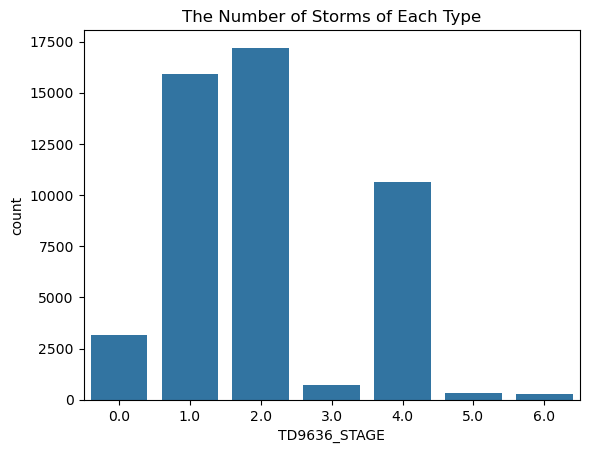

In [185]:
sns.countplot(x='TD9636_STAGE', data=df)
plt.title(f"The Number of Storms of Each Type") 
plt.show()

In [186]:
target_counts = df['TD9636_STAGE'].value_counts()
target_percentages = df['TD9636_STAGE'].value_counts(normalize=True) * 100
result = pd.DataFrame({
    'Count': target_counts,
    'Percentage': target_percentages.round(2)
})
result

,Count,Percentage
TD9636_STAGE,,
2.0,17199,35.69
1.0,15895,32.98
4.0,10615,22.03
0.0,3152,6.54
3.0,742,1.54
5.0,331,0.69
6.0,259,0.54


In [187]:
df.shape

(48193, 48)

In [188]:
nb_storms= df['SID'].nunique()
nb_storms

783

After removing the missing values from the target column TD9636_STAGE, the non-"main storms", and the TRACK_TYPE column, we finally have 48 343 rows and 48 columns. The dataset has 783 storms.

The documentation indicates that the TD9636_STAGE gives an estimate of the highest winds occurring in the storm at the time and location indicated. The entire storm was coded as to the highest stage reached for some of the earlier years. Here is the definition of the definition of the categories :
0 - Tropical disturbance (1969 onward)
1 - depression < 34 (some variation in definition for S Indian)
2 - Storm 34-63 (with some variation in definition for S Indian)
3 - point where wind reached 64 knots (except N Indian where it is wind 43-47 knots)
4 - Hurricane > 64 (except in N Indian, Wind > 48)
5 - Extratropical
6 - Dissipating
7 - Unknown Intensity or doubtful track

The target column, TD9636_STAGE, is an ordinal variable, as the categories have a meaningful order based on storm intensity.

This initial distribution teaches us that stages 1 (depression) and 2 (storm) have the highest counts. This indicates that most storms recorded in the dataset don't intensify beyond the depression or storm stage. There is a significant decrease in the count for stages 3 (winds reaching 64 knots) and 4 (hurricane). This suggests that relatively fewer storms reach the intensity of strong cyclones or hurricanes. Stages 5 (extratropical) and 6 (dissipating) have very low counts which means that extratropical transitions or dissipating storms are not as common.There is no stage 7 (unknown intensity or doubtful track).

### 2.4. Removal of empty columns

In [191]:
missing_values = df.isnull().sum()
missing_percentage = (missing_values / len(df)) * 100

# DataFrame to summarize missing values and their percentages
missing_data = pd.DataFrame({
    "Missing Values": missing_values,
    "Percentage (%)": missing_percentage
}).sort_values(by="Percentage (%)", ascending=False)

print("\nMissing Data:\n", missing_data)


Missing Data:
                  Missing Values  Percentage (%)
KMA_PRES                  48193      100.000000
NADI_PRES                 48193      100.000000
TD9636_PRES               48193      100.000000
KMA_WIND                  48193      100.000000
TD9635_WIND               48193      100.000000
TD9635_PRES               48193      100.000000
NADI_WIND                 48193      100.000000
MLC_WIND                  48193      100.000000
MLC_PRES                  48193      100.000000
NEWDELHI_PRES             47968       99.533127
DS824_PRES                47848       99.284128
NEWDELHI_WIND             47627       98.825556
USA_PRES                  46625       96.746415
NEUMANN_PRES              45292       93.980454
REUNION_PRES              45041       93.459631
DS824_WIND                44552       92.444961
REUNION_WIND              44341       92.007138
WELLINGTON_WIND           43810       90.905318
WELLINGTON_PRES           43810       90.905318
BOM_PRES                

The following columns are completely empty and thus can be deleted from the dataset right away:
- KMA_WIND, 
- TD9635_PRES, 
- NADI_WIND,
- KMA_PRES, 
- TD9636_PRES,
- TD9635_WIND,
- NADI_PRES,
- MLC_WIND,
- MLC_PRES.

In [193]:
columns_to_drop = ['KMA_WIND', 'TD9635_PRES', 'NADI_WIND', 'KMA_PRES','TD9636_PRES', 'TD9635_WIND', 'NADI_PRES', 'MLC_WIND', 'MLC_PRES']
df.drop(columns=columns_to_drop, inplace=True)

In [194]:
df.shape

(48193, 39)

### 2.5. ISO_TIME column

The documentation indicates for the SEASON columns that: " (Year) that the storm began. Due to how the Southern Hemisphere defines a season, storms after July 1 are classified with the following year". Also it indicates for the ISO_TIME column that : "ISO Time provided in Universal Time Coordinates (UTC). Format is YYYY-MM-DD HH:mm:ss.". 

Thus, it can be interesting to : 
- Isolate and use the year in the ISO_TIME column as reference,
- Isolate the month from the ISO_TIME column can be an intresting information as it will introduce seasonality in the analysis. 

In order to avoid redundant column and for more coherence, the ISO_TIME column and the SEASON one will be dropped.

In [197]:
df.insert(7,'YEAR', df['ISO_TIME'].dt.year)
df.insert(8, 'MONTH', df['ISO_TIME'].dt.month)
df.drop(columns=['SEASON', 'ISO_TIME'], inplace=True)
df.head(3)

,SID,BASIN,SUBBASIN,NAME,NATURE,YEAR,MONTH,LAT,LON,WMO_WIND,WMO_PRES,WMO_AGENCY,DIST2LAND,LANDFALL,USA_WIND,USA_PRES,USA_SSHS,TOKYO_WIND,TOKYO_PRES,CMA_WIND,CMA_PRES,HKO_WIND,HKO_PRES,NEWDELHI_WIND,NEWDELHI_PRES,REUNION_WIND,REUNION_PRES,BOM_WIND,BOM_PRES,WELLINGTON_WIND,WELLINGTON_PRES,DS824_WIND,DS824_PRES,TD9636_STAGE,TD9636_WIND,NEUMANN_WIND,NEUMANN_PRES,STORM_SPEED,STORM_DIR
1,1980001S13173,SP,MM,PENI,TS,1980,1,-12.5,172.5,NaN,NaN,NaN,647,647.0,25.0,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,NaN,1.0,25.0,25.0,NaN,6.0,350.0
2,1980001S13173,SP,MM,PENI,TS,1980,1,-12.2,172.4,NaN,NaN,NaN,653,653.0,25.0,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,NaN,1.0,NaN,25.0,NaN,6.0,350.0
3,1980001S13173,SP,MM,PENI,TS,1980,1,-11.9,172.4,NaN,NaN,NaN,670,670.0,25.0,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,NaN,1.0,NaN,25.0,NaN,5.0,360.0


### 2.6.  Descriptive statistics of the pre-selected columns 

#### 2.6.1. Summary Statistics

<u>Maximum sustained wind speeds columns</u>

In [201]:
WIND_columns = ['WMO_WIND', 'USA_WIND', 'TOKYO_WIND', 'CMA_WIND', 'HKO_WIND', 'NEWDELHI_WIND', 'REUNION_WIND','BOM_WIND','WELLINGTON_WIND','DS824_WIND','TD9636_WIND','NEUMANN_WIND']

stat_WIND_columns = df[WIND_columns].describe()

print("\nBasic statistical analysis for WIND columns:\n",stat_WIND_columns)


Basic statistical analysis for WIND columns:
            WMO_WIND      USA_WIND    TOKYO_WIND      CMA_WIND      HKO_WIND  \
count  17242.000000  40398.000000  10842.000000  15153.000000  13002.000000   
mean      51.288714     50.039383     60.406936     51.209068     54.715351   
std       22.401557     25.486067     18.982975     24.620630     23.557309   
min       10.000000     10.000000     35.000000     17.000000     20.000000   
25%       35.000000     30.000000     45.000000     29.000000     35.000000   
50%       45.000000     43.000000     55.000000     48.000000     50.000000   
75%       65.000000     65.000000     73.000000     68.000000     70.000000   
max      135.000000    155.000000    125.000000    145.000000    135.000000   

       NEWDELHI_WIND  REUNION_WIND     BOM_WIND  WELLINGTON_WIND   DS824_WIND  \
count     566.000000   3852.000000  6286.000000      4383.000000  3641.000000   
mean       45.913428     40.460800    47.786828        49.942505    49.684153  

According to the documentation, the maximum sustained wind speeds for tropical cyclones are the highest surface winds occurring within the circulation of the system. These "surface" winds are those observed (or, more often, estimated) to occur at the standard meteorological height of 10 m (33 ft) in an unobstructed exposure (i.e., not blocked by buildings or trees).

Due to different amount of missing values and also differences in the wind measurements across different agencies, the variation of the WIND speed is very different. For example, TOKYO_WIND has a higher mean wind speed (60.58 knots) compared to USA_WIND (50.68 knots) or CMA_WIND (53.64 knots). 

All the agencies have recorded wind speed, on average, more or less 50 knots (-5/+5), except TOKYO_WIND.

The reason why TOKYO_WIND has the highest mean is because they estimate the wind speed on a 10 minute averaging period and among the other agencies that use that methodology it has the highest amount of data. 

USA_WIND and TD9636_WIND, which are the fullest columns, are very similar: 
- They both have an important number of records, 
- They have a similar mean (USA_WIND : 50.68 knots, TD9636_WIND : 50.23 knots), std (USA_WIND : 25.55, TD9636_WIND : 25.55), 25th (USA_WIND : 30.00 knots, TD9636_WIND : 30.00 knots), 50th (USA_WIND : 45.00 knots, TD9636_WIND : 43.00 knots), 75th (USA_WIND : 65.00 knots, TD9636_WIND : 65.00 knots) and max (USA_WIND : 155.00 knots, TD9636_WIND : 155.00 knots).

This is due to the fact that the estimation of the wind speed is the same from USA agencies (North Atlantic - U.S. Miami (NOAA NHC)) and Tape Deck 9636. It is estimated with the highest wind speed on a 1 minute averaging period.

The min differ (USA_WIND : 10.00 knots, TD9636_WIND : 5.00 knots), which suggest that there is a chance that both columns could be complementary (don't have the same exact missing values). That could reduce the amount of missing values as they both have the same methodology to estimate the wind speed.

For each column the mean is superior to the median which indicates that the WIND_columns distribution is positively skewed.

<u>Minimum central pressure columns</u>

In [204]:
PRES_columns = ['WMO_PRES', 'USA_PRES', 'TOKYO_PRES', 'CMA_PRES', 'HKO_PRES', 'NEWDELHI_PRES', 'REUNION_PRES','BOM_PRES','WELLINGTON_PRES','DS824_PRES','NEUMANN_PRES']

stat_PRES_columns = df[PRES_columns].describe()

print("\nBasic statistical analysis for PRES columns:\n",stat_PRES_columns)


Basic statistical analysis for PRES columns:
            WMO_PRES     USA_PRES    TOKYO_PRES      CMA_PRES      HKO_PRES  \
count  14756.000000  1568.000000  15406.000000  15167.000000  13002.000000   
mean     983.816346   997.155612    982.155654    981.806092    978.551146   
std       20.531475    15.737801     22.554263     22.082155     22.315939   
min      880.000000   935.000000    880.000000    876.000000    879.000000   
25%      975.000000   991.000000    970.000000    970.000000    965.000000   
50%      990.000000  1003.000000    990.000000    989.000000    985.000000   
75%      998.000000  1009.000000    999.000000    998.000000    995.000000   
max     1015.000000  1015.000000   1014.000000   1012.000000   1010.000000   

       NEWDELHI_PRES  REUNION_PRES     BOM_PRES  WELLINGTON_PRES   DS824_PRES  \
count     225.000000   3152.000000  6150.000000      4383.000000   345.000000   
mean      987.146667    984.690990   984.535122       981.656172   968.086957   
std    

The documentation explains that the minimum central pressure is the estimated lowest surface pressure in the tropical cyclone. This represents the pressure at the center of circulation reduced to sea level (though tropical cyclones almost always occur at sea level, so usually no reduction is necessary). Minimum central pressure is widely agreed as a parameter that is easily comparable between agencies, though observational differences still lead to discrepancies.

Probably due to the fact that the pressure information is not always filled in the dataset (TOKYO_PRES has the most amount of values and contains 68.64 % of data), the variability between the agencies is important.The mean of the pressure ranges between 967.73 mb and 997.15 mb.

TOKYO_PRES and CMA_PRES are very similar : 
- They both have an important amount of records, 
- They have a similar mean (TOKYO_PRES: 980.56 mb, CMA_PRES: 980.03 mb), std (TOKYO_PRES: 22.75, CMA_PRES: 22.24), 25th (TOKYO_PRES: 970.00 mb, CMA_PRES: 970.00 mb), 50th (TOKYO_PRES: 988.00 mb, CMA_PRES: 987.00 mb), 75th (TOKYO_PRES:  998.00 mb, CMA_PRES: 997.00 mb) and max (TOKYO_PRES: 1014.00 mb, CMA_PRES: 1010.00 mb).
- The min also slightly differ (TOKYO_PRES: 880.00 mb, CMA_PRES: 876.00 mb)

For each column the mean is inferior to the median which indicates that the PRES_columns distribution is negatively skewed.

<u> Proximity to land</u>

In [207]:
DISTANCE_columns = ['DIST2LAND', 'LANDFALL']

stat_DISTANCE_columns = df[DISTANCE_columns].describe()

print("\nBasic statistical analysis for DISTANCE columns:\n",stat_DISTANCE_columns)


Basic statistical analysis for DISTANCE columns:
           DIST2LAND      LANDFALL
count  48193.000000  47753.000000
mean     865.401677    850.118548
std      708.479357    706.602497
min        0.000000      0.000000
25%      289.000000    275.000000
50%      674.000000    658.000000
75%     1343.000000   1325.000000
max     4736.000000   4695.000000


The DIST2LAND variable represents the distance to land from the current position of a storm. The land dataset includes all continents and any islands larger than 1400 km^2. The distance is the nearest at the present time in any direction. 

On the meantime, LANDFALL is the nearest location to land within next 6 hours.

Thus the mean is higher in for the DIST2LAND mean. But, these two features are very similar and can create potential redundancy. As DIST2LAND represents the storm's current distance to land, which is a real-time indicator, keeping DIST2LAND and dropping LANDFALL is justified.

In [209]:
df.drop(columns=['LANDFALL'], inplace=True)

<u>Categorical columns</u>

In [211]:
CAT_columns_of_intrest = ['BASIN', 'SUBBASIN', 'NATURE', 'TD9636_STAGE']

for column in CAT_columns_of_intrest:
    print(f"Analysis for column: {column}")
    value_counts = df[column].value_counts()
    percentages = (value_counts / value_counts.sum()) * 100
    summary = pd.DataFrame({
        'Count': value_counts,
        'Percentage (%)': percentages
    })
    
    print(summary)
    print()

Analysis for column: BASIN
       Count  Percentage (%)
BASIN                       
WP     19740       40.960305
SI     10923       22.665117
EP      9831       20.399228
SP      5743       11.916668
NI      1956        4.058681

Analysis for column: SUBBASIN
          Count  Percentage (%)
SUBBASIN                       
MM        38463       79.810346
WA         3993        8.285436
EA         2213        4.591953
CP         1568        3.253585
BB         1360        2.821987
AS          596        1.236694

Analysis for column: NATURE
        Count  Percentage (%)
NATURE                       
TS      42530       88.249331
MX       3061        6.351545
DS       2301        4.774552
ET        171        0.354823
NR        130        0.269749

Analysis for column: TD9636_STAGE
              Count  Percentage (%)
TD9636_STAGE                       
2.0           17199       35.687755
1.0           15895       32.981968
4.0           10615       22.026020
0.0            3152        6.

<u> Storm occurrence and localization</u>

As a reminder, the TD9636 dataset is used in IBTrACS outside of the Noth Atlantic.
- The Western Pacific (WP) is the most active storm region (48.1%), and the South Indian Ocean (26%) with the South Pacific Ocean (14.7%) together account for 40 % of storms, indicating a significant storm activity in the Southern Hemisphere.
- Most storms (77%) occur in the MM, which means no subbasins are provided for WP and SI. This suggest that Western Pacific and South Indian dominate storm activity

<u> Storm occurrence and type </u>

Tropical storms dominate the dataset (94.23%), which expected since most storms originate as tropical.

#### 2.6.2. Distribution of numerical data

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


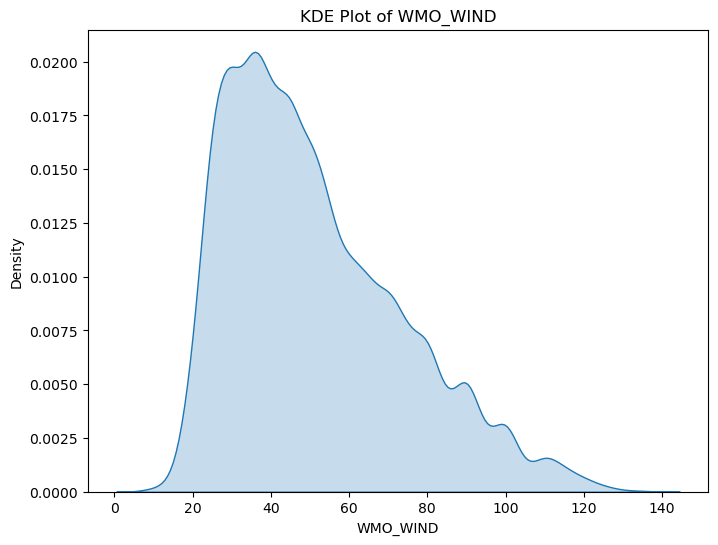

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


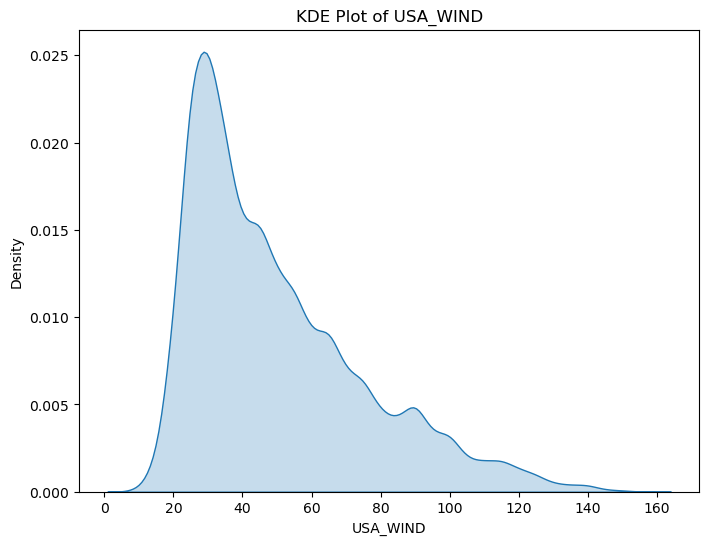

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


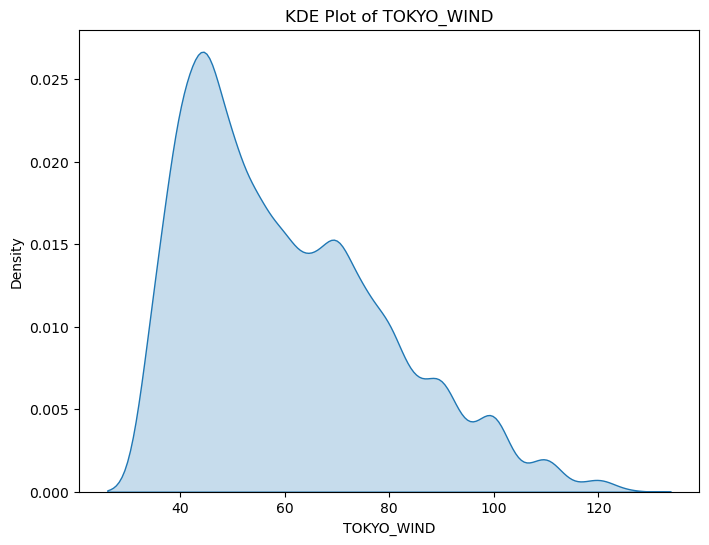

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


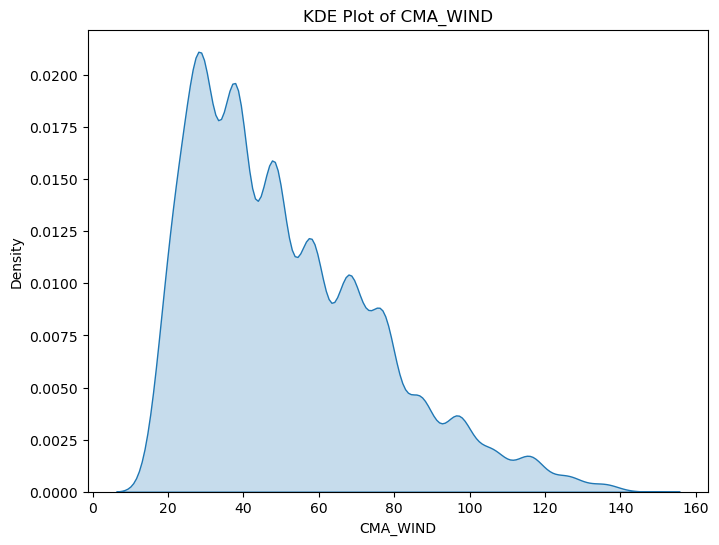

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


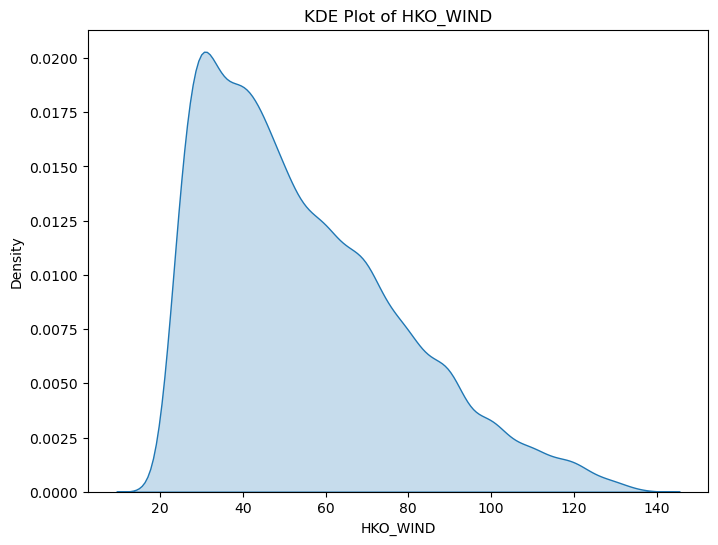

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


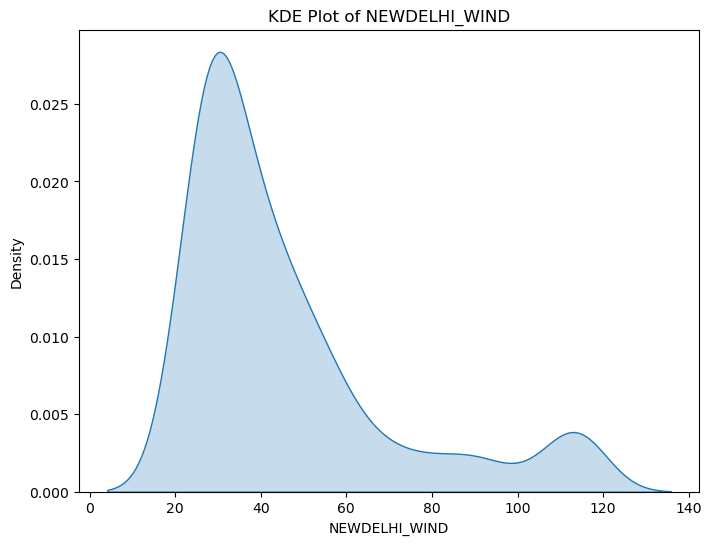

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


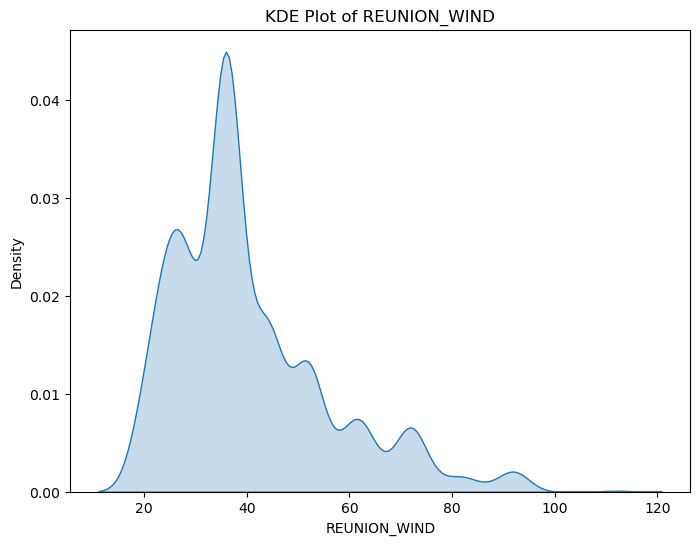

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


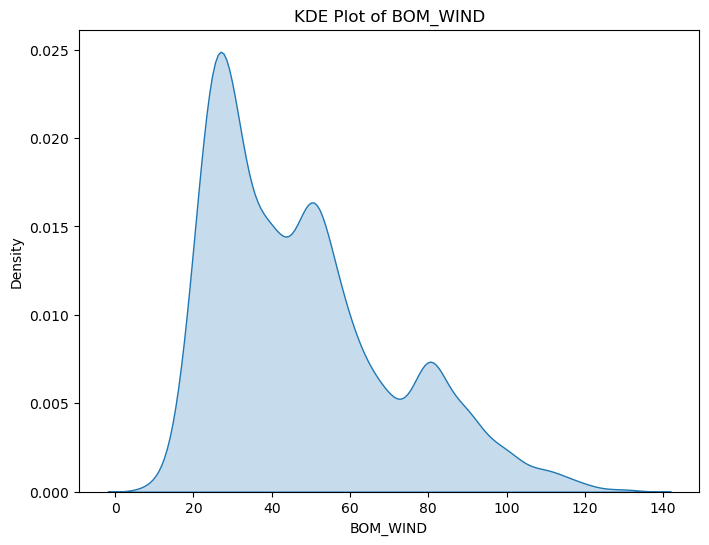

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


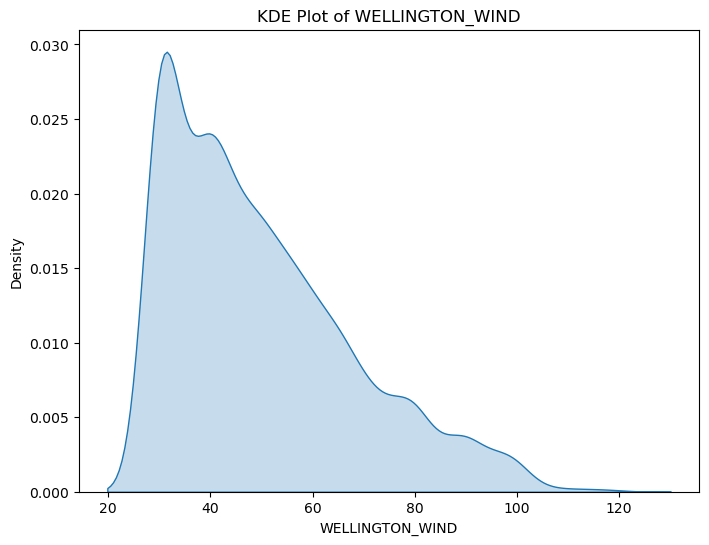

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


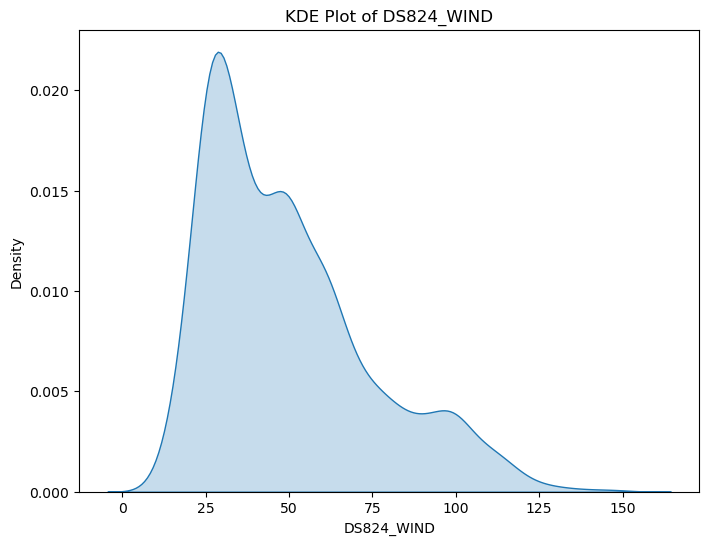

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


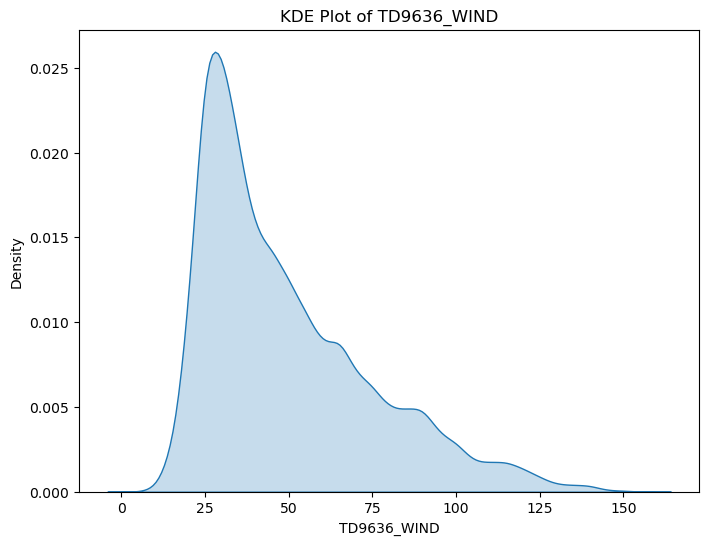

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\2459957982.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


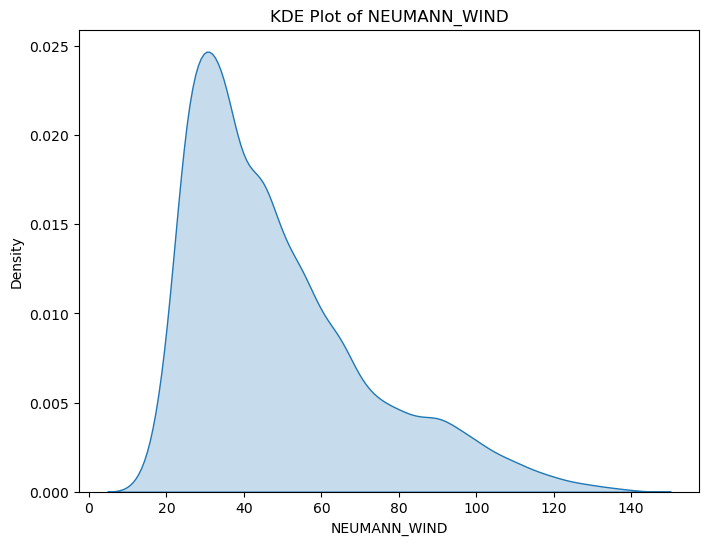

In [214]:
WIND_columns = ['WMO_WIND', 'USA_WIND', 'TOKYO_WIND', 'CMA_WIND', 'HKO_WIND','NEWDELHI_WIND', 'REUNION_WIND', 'BOM_WIND', 'WELLINGTON_WIND','DS824_WIND', 'TD9636_WIND', 'NEUMANN_WIND']

for col in WIND_columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(df[col], shade=True)
    plt.title(f'KDE Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


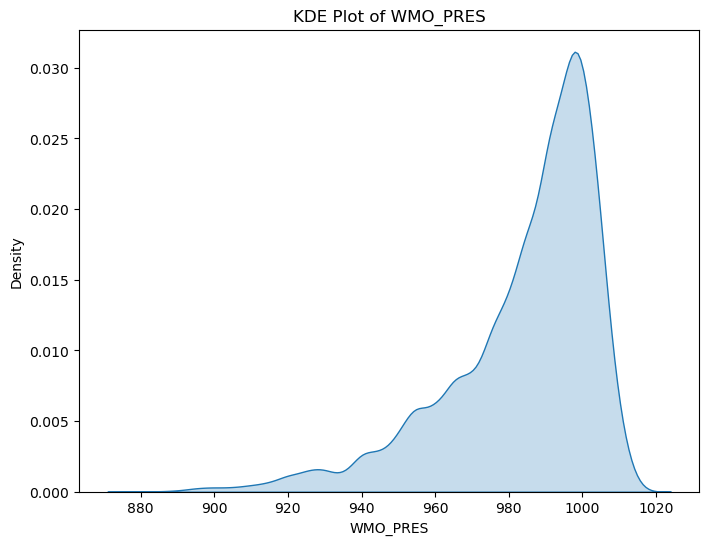

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


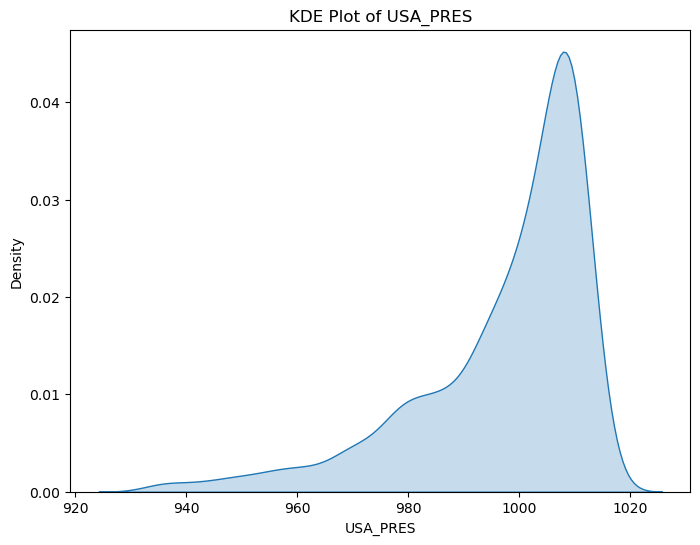

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


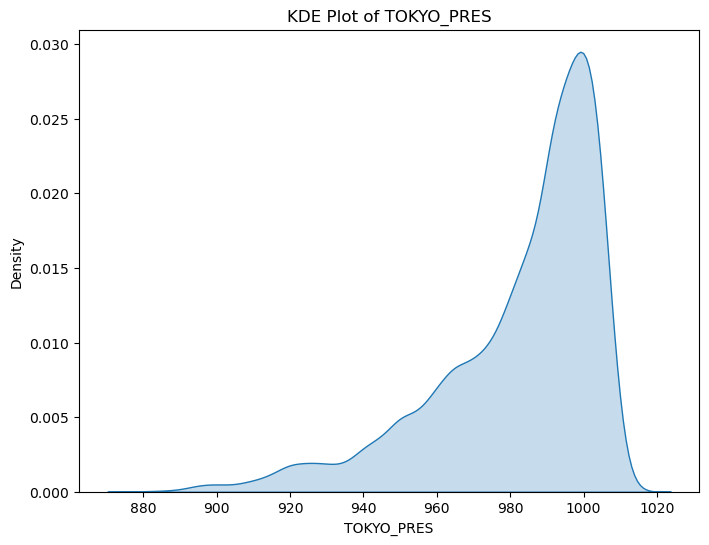

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


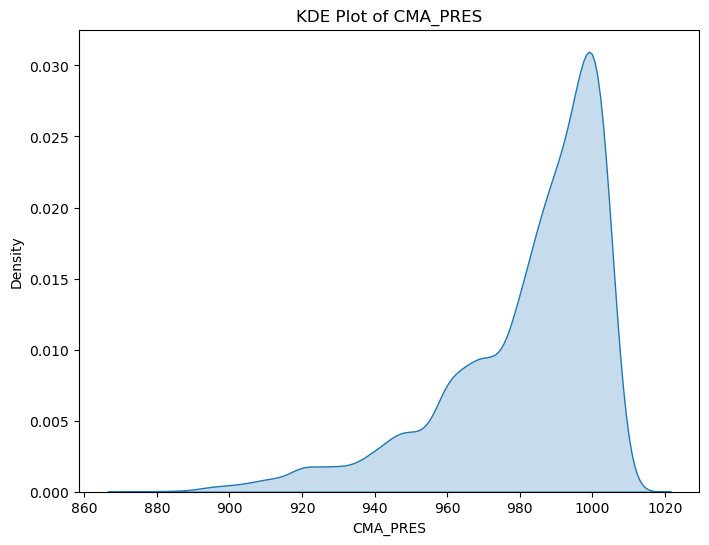

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


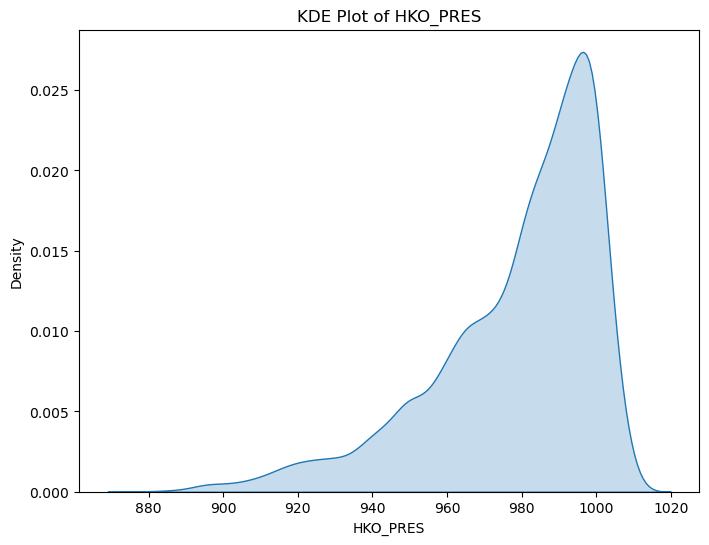

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


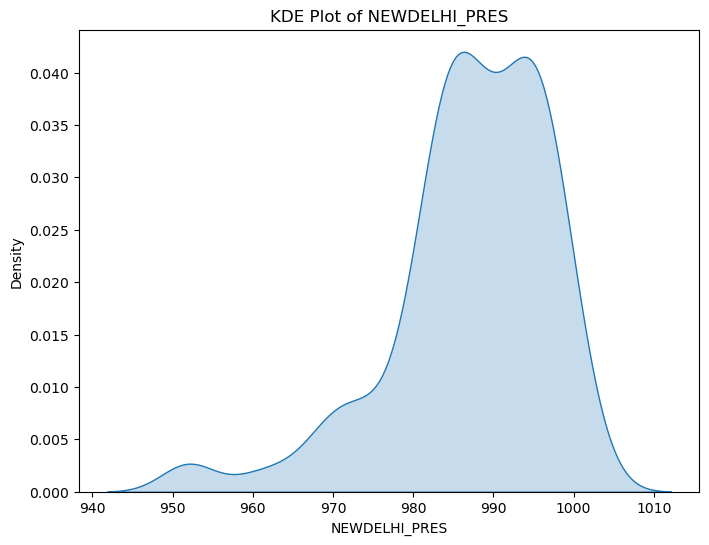

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


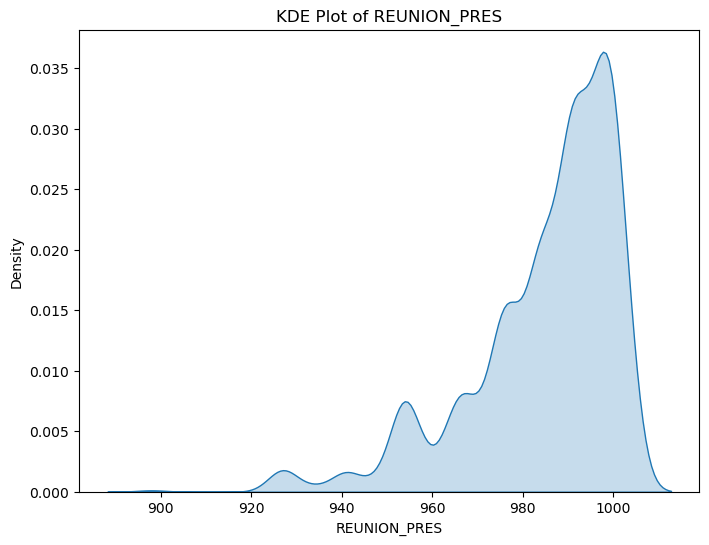

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


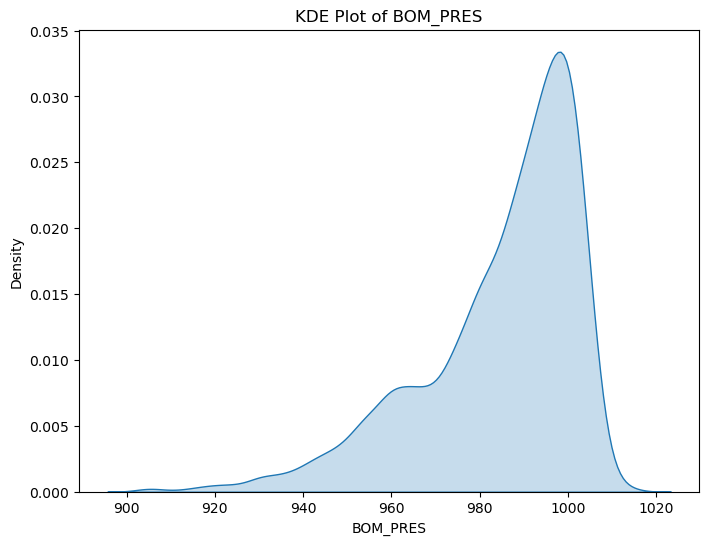

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


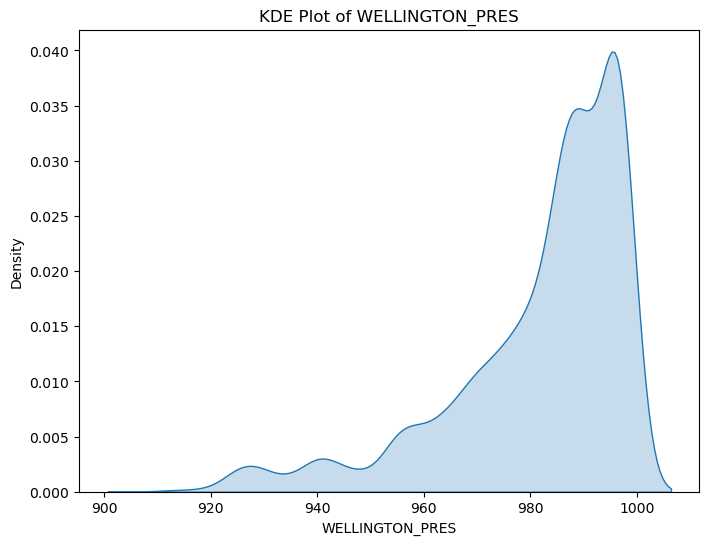

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


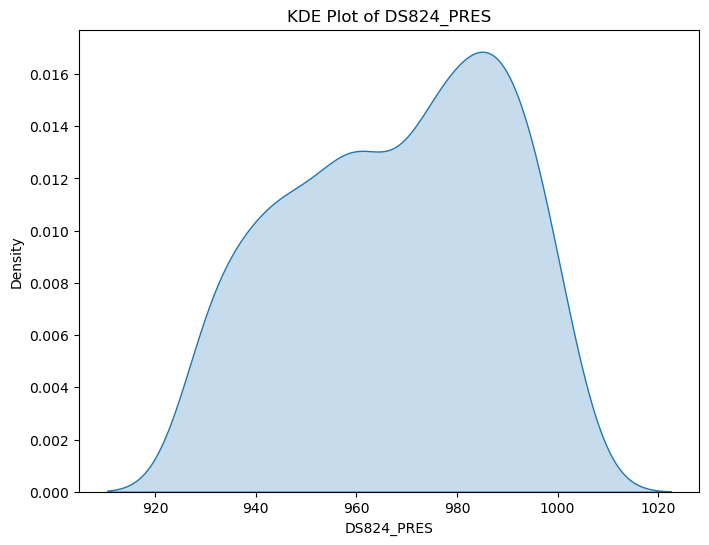

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\398610722.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[col], shade=True)


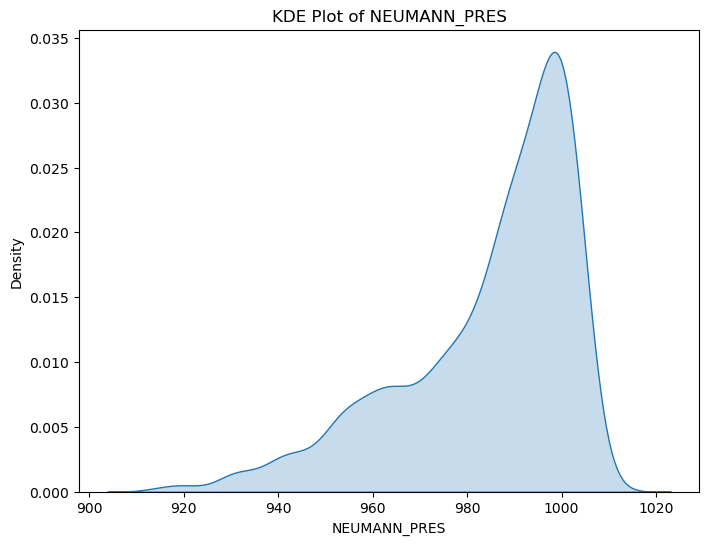

In [215]:
PRES_columns = ['WMO_PRES', 'USA_PRES', 'TOKYO_PRES', 'CMA_PRES', 'HKO_PRES', 'NEWDELHI_PRES', 'REUNION_PRES','BOM_PRES','WELLINGTON_PRES','DS824_PRES','NEUMANN_PRES']

for col in PRES_columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(df[col], shade=True)
    plt.title(f'KDE Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

C:\Users\Administrateur\AppData\Local\Temp\ipykernel_9840\3285718837.py:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df['DIST2LAND'], shade=True)


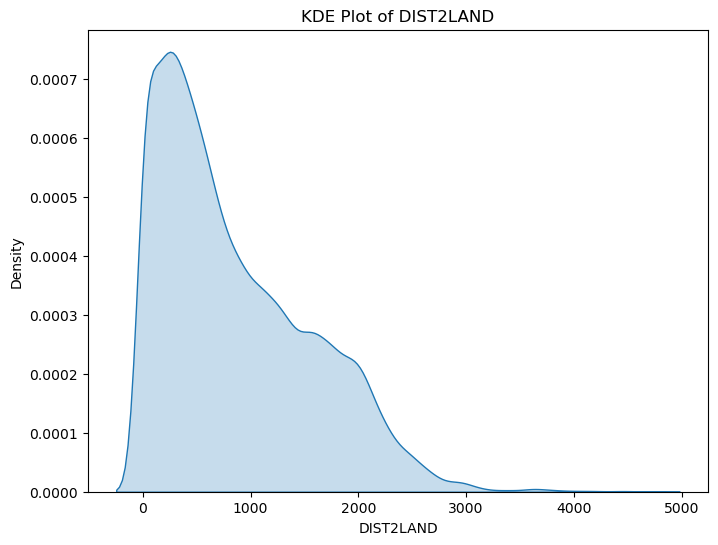

In [218]:
plt.figure(figsize=(8, 6))
sns.kdeplot(df['DIST2LAND'], shade=True)
plt.title('KDE Plot of DIST2LAND')
plt.xlabel('DIST2LAND')
plt.ylabel('Density')
plt.show()

<u> WIND_columns distribution </u>

The KDE plots of the WIND_columns show that according to the different agencies from all around the world, the wind speed has a positively skewed distribution. The density peaks around 35-45 knots and the frequency gradually decreases as wind speed increases. There is a long tail extending towards higher wind speeds (above 100), indicating fewer occurrences of extreme storms.

<u> PRES_columns distribution </u>

The KDE plots of the PRES_columns are negatively skewed. They have a long tail on the left, indicating that lower pressure values are less frequent but still present. Most data are concentrated between 980 and 1000 mb. After seeing the WMO_columns KDE plots we can understand so far that lower the pressure, more intense the storms can be.

<u> DIST2LAND distribution </u>

The KDE plot of DIST2LAND is positively skewed. It shows a high density near 0, meaning many data points are close to land. The density gradually decreases as the distance increases, with a long tail extending towards larger values (above 3000 km). This suggests that most storms occur relatively close to land, but some exist far out in the ocean. 

### 2.7. Filling Missing Values in WMO_WIND and WMO_PRES

WMO_WIND & WMO_PRES have a lot missing values. We'll attempt to fill these columns as we believe they are major factors in explaining the strength of a storm and therefore would be more than useful for the ML algorithm as explanatory variables. <br> (The calculation of the correlation between WMO_WIND, WMO_PRESSURE, and the target column can be seen [here](#))

It'll be done in 3 main steps:
* The first one to fill the WMO_AGENCY column, to know for each storm which agency is supposed to have the results
* Then we'll fill the WMO_WIND column based on the WMO_AGENCY one
* Finally we'll fill the WMO_PRES column following the same methodology

#### 2.7.1. Fill the WMO_AGENCY

In [237]:
# Assess the WMO_AGENCY, WMO_WIND and WMO_PRES column and how many NA there are.
df['WMO_AGENCY'] = df['WMO_AGENCY'].str.strip()
df['WMO_AGENCY'] = df['WMO_AGENCY'].replace('', np.nan)
before_agency = df['WMO_AGENCY'].isna().sum()
before_wind = df['WMO_WIND'].isna().sum()
before_press = df['WMO_PRES'].isna().sum()
print(before_agency, before_wind, before_press)

28106 30951 33437


In [239]:
# Fill the WMO_AGENCY column
for SID in df['SID'].unique():
    cyclone_data = df[df['SID'] == SID]
    agency = cyclone_data['WMO_AGENCY'].dropna().unique()
    if len(agency) == 1: # In case the WMO AGENCY in charge of reporting change, we'll leave it as empty to not bias the data
        df.loc[df['SID'] == SID, 'WMO_AGENCY'] = agency[0]

In [243]:
# The goal is to count how many times each agency occurs, how many non recorded values and the proportion it represents.
# Count how many times each agences are recorded
agency_count = df['WMO_AGENCY'].value_counts()
agency_count = agency_count.reset_index()
agency_count.columns = ['WMO_AGENCY','counts']
agency_count.set_index('WMO_AGENCY',inplace = True)

# Map the different agencies and their respective WIND columns
agency_wind = {
    'wellington': 'WELLINGTON_WIND',
    'reunion': 'REUNION_WIND',
    'bom': 'BOM_WIND',
    'cphc': 'USA_WIND',
    'tokyo': 'TOKYO_WIND',
    'hurdat_epa': 'USA_WIND',
    'hurdat_atl': 'USA_WIND',
    'newdelhi': 'NEWDELHI_WIND',
    'atcf': 'USA_WIND'
}

# Count the NA, meaning the rows for which we have an agency recorded but don't have any recorded WIND to the relevant WIND column
nan_counts = {}

for a,w in agency_wind.items():
    df1 = df[df['WMO_AGENCY'] == a]
    nan_counts[a] = df1[w].isna().sum()

nan_counts = pd.DataFrame.from_dict(nan_counts, orient='index', columns=['NaN_COUNT'])
nan_counts = nan_counts.reset_index()
nan_counts.columns = ['WMO_AGENCY','NaN_COUNT']
nan_counts.set_index('WMO_AGENCY',inplace = True)

# Compute the proportion of the number of times each agences are recorded but don't have any values in their corresponding WIND columns
nan_percent = {}
for a in agency_count.index:
    nan_percent[a] = nan_counts.loc[a, 'NaN_COUNT'] / agency_count.loc[a, 'counts']
nan_percent = pd.DataFrame.from_dict(nan_percent, orient='index', columns=['NaN_Ratio'])
nan_percent = nan_percent.reset_index()
nan_percent.columns = ['WMO_AGENCY', 'NaN_Ratio']
nan_percent.set_index('WMO_AGENCY',inplace = True)

nan = pd.concat([agency_count, nan_counts, nan_percent], axis = 1)
print(nan)
print(df['WMO_WIND'].isna().sum())

             counts  NaN_COUNT  NaN_Ratio
WMO_AGENCY                               
tokyo       18931.0       8216   0.433997
hurdat_epa   9488.0          0   0.000000
bom          5826.0        287   0.049262
reunion      5606.0       1994   0.355690
wellington   2988.0        274   0.091700
newdelhi     1217.0        664   0.545604
cphc           58.0          1   0.017241
hurdat_atl      1.0          0   0.000000
atcf            NaN          0        NaN
30951


#### 2.7.2. Fill the WMO_WIND

Agencies measure the highest windspeed based on an average over different period of time:
* Wellington: avg 10min <br>
* Reunion: avg 10min <br>
* Bom: avg 10min <br>
* cphc: avg 1min (hawaii) <br>
* tokyo: avg 10min <br>
* hurdat_epa: avg 1min <br>
* hurdat_atl: avg 1min <br>
* newdelhi: avg 3min <br>
* atcf: avg 1min (USA) <br>

The goal is to "harmonize" the average so the different wind data that we have can be compared and used by the ML algorithm later on to predict the severity of the storm. To do so, following the WMO guideline, we decided to harmonize the averages to 1min, the average used by the USA's agencies. The conversion remains an approximation but it is still widely used in meteorology. <br>
* To proceed from a 10min avg to a 1min average: **10min average * 1.12**
* To proceed from a 3min avg to a 1min avg: **3min average * 1.05**

In [248]:
# Create an array containing all the names of the WMO_AGENCIES
agency = np.array(df['WMO_AGENCY'].dropna().unique())

# Create an array containing all the WIND columns that we'll use
wind_col = np.array(['WELLINGTON_WIND', 'REUNION_WIND', 'BOM_WIND', 'USA_WIND', 
                     'TOKYO_WIND', 'USA_WIND', 'USA_WIND', 'NEWDELHI_WIND', 'USA_WIND'])

# If wind_col is longer than agency, trim it to match the length of agency
if len(wind_col) > len(agency):
    wind_col = wind_col[:len(agency)]
# If agency is longer than wind_col, repeat the wind_col values to match the length
elif len(agency) > len(wind_col):
    wind_col = np.resize(wind_col, len(agency))

# Create an array
average = {
    'wellington': '10min',
    'reunion': '10min',
    'bom': '10min',
    'cphc': '1min',
    'tokyo': '10min',
    'hurdat_epa': '1min',
    'hurdat_atl': '1min',
    'newdelhi': '10min',
    'atcf': '1min'
}

# Now creating the DataFrame should work
df1 = pd.DataFrame({
    'WMO_AGENCY': agency,
    'WIND_COLUMN': wind_col
})

df1['AVERAGE'] = df1['WMO_AGENCY'].map(average)

# Conversions factors:
conversion = {
    '10min': 1.12,
    '3min': 1.05,
    '1min': 1
}

# Check the different WIND columns average before adjustment
average_before = {}
for column in wind_col:
    average_before[column] = df[column].mean()

# Adjust the different WIND columns to 1min average
for a, b in df1.iterrows():
    # Get the different parameters, agency name, relevant wind column and average used
    agency_name = b['WMO_AGENCY']
    wind_column = b['WIND_COLUMN']
    average_method = b['AVERAGE']

    # Get the conversion factor for each row depending on the agency and therefore the average used
    factor = conversion[average_method]

    # Adjust the wind column to a 1min average period
    df[wind_column] = df[wind_column] * factor

# Check the different WIND columns average after adjustment
average_after = {}
for a in wind_col:
    average_after[a] = df[a].mean()

# Confirm WIND columns average adjustment
print(average_before)
print(average_after)

{'WELLINGTON_WIND': 49.94250513347023, 'REUNION_WIND': 40.46079958463136, 'BOM_WIND': 47.78682787146039, 'USA_WIND': 50.0393831377791, 'TOKYO_WIND': 60.406935989669805, 'NEWDELHI_WIND': 45.91342756183746}
{'WELLINGTON_WIND': 55.93560574948666, 'REUNION_WIND': 45.31609553478713, 'BOM_WIND': 53.52124721603563, 'USA_WIND': 56.04410911431259, 'TOKYO_WIND': 67.65576830843018, 'NEWDELHI_WIND': 45.91342756183746}


In [249]:
# Fill the WMO_WIND columns
for index in df.index:
    if pd.isna(df.loc[index,'WMO_WIND']):
        agency_name = df.loc[index,'WMO_AGENCY']
        if pd.notna(agency_name):  # Check if agency_name is not NA
            wind_column = agency_wind[agency_name]  # Get the corresponding wind column
            df.loc[index, 'WMO_WIND'] = df.loc[index, wind_column]  # Assign the correct wind value

In [250]:
# All the remaining NA in WMO_WIND are explained either because they didn't have any reporting agency, either because their reporting agency didn't report any wind data.
# For both these cases, we decided to fill them by the USA_WIND data which is in a lot of cases not empty, whenever possible.
df['WMO_WIND'] = df['WMO_WIND'].fillna(df['USA_WIND'])

In [251]:
# The remaining NA are storms for which no relevant agency reported anything. We hence will remove them.
after_agency = df['WMO_AGENCY'].isna().sum()
after_wind = df['WMO_WIND'].isna().sum()
after_press = df['WMO_PRES'].isna().sum()
print(after_agency,after_wind)

4078 4840


#### 2.7.3. Fill the WMO_PRES

In [253]:
# The goal is to count how many times each agency occurs, how many non recorded values and the proportion it represents.
# Count how many times each agencies are recorded
agency_count = df['WMO_AGENCY'].value_counts()
agency_count = agency_count.reset_index()
agency_count.columns = ['WMO_AGENCY','counts']
agency_count.set_index('WMO_AGENCY',inplace = True)

# Map the different agencies and their respective PRES columns
agency_pres = {
    'wellington': 'WELLINGTON_PRES',
    'reunion': 'REUNION_PRES',
    'bom': 'BOM_PRES',
    'cphc': 'USA_PRES',
    'tokyo': 'TOKYO_PRES',
    'hurdat_epa': 'USA_PRES',
    'hurdat_atl': 'USA_PRES',
    'newdelhi': 'NEWDELHI_PRES',
    'atcf': 'USA_PRES'
}
nan_counts = {}

for agency,pres in agency_pres.items():
    df1 = df[df['WMO_AGENCY'] == agency]
    nan_counts[agency] = df1[pres].isna().sum()

nan_counts = pd.DataFrame.from_dict(nan_counts, orient='index', columns=['NaN_Count'])
nan_counts = nan_counts.reset_index()
nan_counts.columns = ['WMO_AGENCY','NaN_Count']
nan_counts.set_index('WMO_AGENCY',inplace = True)

# Compute the proportion of the number of times each agences are recorded but don't have any values in their corresponding PRES columns
nan_percent = {}
for a in agency_count.index:
    nan_percent[a] = nan_counts.loc[a, 'NaN_Count'] / agency_count.loc[a, 'counts']

nan_percent = pd.DataFrame.from_dict(nan_percent, orient='index', columns=['NaN_Ratio'])
nan_percent = nan_percent.reset_index()
nan_percent.columns = ['WMO_AGENCY', 'NaN_Ratio']
nan_percent.set_index('WMO_AGENCY',inplace = True)

nan = pd.concat([agency_count, nan_counts, nan_percent], axis = 1)
print(nan)
print(df['WMO_PRES'].isna().sum())

             counts  NaN_Count  NaN_Ratio
WMO_AGENCY                               
tokyo       18931.0       3687   0.194760
hurdat_epa   9488.0       8000   0.843170
bom          5826.0        336   0.057673
reunion      5606.0       2617   0.466821
wellington   2988.0        274   0.091700
newdelhi     1217.0        992   0.815119
cphc           58.0         57   0.982759
hurdat_atl      1.0          0   0.000000
atcf            NaN          0        NaN
33437


In [254]:
# Fill the WMO_PRES columns
for index in df.index:
    if pd.isna(df.loc[index,'WMO_PRES']):
        agency_name = df.loc[index,'WMO_AGENCY']
        if pd.notna(agency_name):  # Check if agency_name is not NA
            pres_column = agency_pres[agency_name]  # Get the corresponding wind column
            df.loc[index, 'WMO_PRES'] = df.loc[index, pres_column]  # Assign the correct wind value

In [255]:
df['WMO_PRES'].isna().sum()

20016

In [256]:
# All the remaining NA in WMO_WIND are explained either because they didn't have any reporting agency, either because their reporting agency didn't report any wind data.
# For both these cases, we decided to fill them by the USA_WIND data which is in a lot of cases not empty, whenever possible.
df['WMO_PRES'] = df['WMO_PRES'].fillna(df['USA_PRES'])

In [257]:
# The PRES columns in the data provided are more often not completed compared to the WIND columns. Therefore, even after filling the WMO_PRES column, we're still left with 16k+ na. Nonetheless, we would still have about 26k lines, which is good enough.
print(df['WMO_WIND'].isna().sum())
print(df['WMO_PRES'].isna().sum())
len(df)

4840
19938


48193

In [258]:
len(df)
df["TD9636_STAGE"].value_counts()

TD9636_STAGE
2.0    17199
1.0    15895
4.0    10615
0.0     3152
3.0      742
5.0      331
6.0      259
Name: count, dtype: int64

In [259]:
# Removing of the remaining na
df = df[~df[['WMO_WIND', 'WMO_PRES']].isna().any(axis = 1)]

In [260]:
len(df)
df["TD9636_STAGE"].value_counts()

TD9636_STAGE
2.0    11502
4.0     7496
1.0     7127
3.0      477
0.0      229
5.0      196
6.0       48
Name: count, dtype: int64

## 3. Exploratory Data Analysis

### 3.1. Correlation Analysis of Features

#### 3.1.1 Correlation between Features

To begin with, let's examine the correlation matrix to gain a clearer understanding of the relationships between the features.

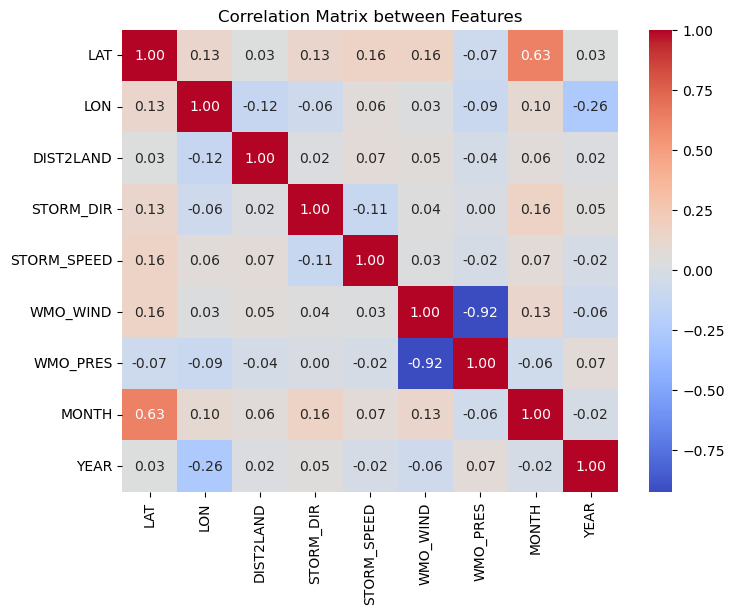

In [266]:
# Calculate the correlation matrix
corr_matrix = df[['LAT', 'LON', 'DIST2LAND', 'STORM_DIR', 'STORM_SPEED', 'WMO_WIND', 'WMO_PRES', 'MONTH', 'YEAR']].corr()

# Visualize the correlation matrix
plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix between Features")
plt.show()

Even though WHO_WIND and WHO_PRES are highly correlated, we still want to keep both features for a few reasons:

- **Different Information**: Each feature provides unique information. WHO_WIND is about wind speed, while WHO_PRES is related to pressure. Both can be important for understanding storm intensity, and removing one might lose valuable details.

- **No Problem for Tree-Based Models which what we are using**: High correlation can be an issue in models like linear regression, but tree-based models like decision trees or random forests can handle it well. They don’t rely on features being uncorrelated, so both features can still be useful.

We observe a relationship between month and latitude, which may indicate seasonality in the data. Let's explore this further in the next section.

Other Features Are Uncorrelated.

#### 3.1.2. Correlation with Target Variable

##### `WMO_WIND` vs. `TD9636_STAGE`

In [270]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['WMO_WIND'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['WMO_WIND'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: 0.7944445445195975, p-value: 0.0
Kendall Correlation: 0.6741956108240172, p-value: 0.0


There is a strong positive correlation (0.794) between the variables, which is statistically significant (p-value ≈ 0). This means that an increase in one variable is associated with an increase in the other, and this relationship is not random.

##### `WMO_PRES` vs. `TD9636_STAGE`

In [274]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['WMO_PRES'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['WMO_PRES'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: -0.7893745599297727, p-value: 0.0
Kendall Correlation: -0.6653054498826877, p-value: 0.0


There is a strong negative correlation of -0.79 between the variables, and the relationship is statistically significant with a p-value of 0. This suggests a reliable and consistent inverse relationship between the variables

#####  `DIST2LAND` vs. `TD9636_STAGE`

In [278]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['DIST2LAND'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['DIST2LAND'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")


Spearman Correlation: 0.008247802685108255, p-value: 0.17475144439840318
Kendall Correlation: 0.006191635368677742, p-value: 0.18317196951956005


Both Spearman and Kendall's Tau correlations indicate a very weak positive relationship between the variables. The p-values for both correlations are greater than 0.05, which suggests that the relationship is not statistically significant.

#####  `MONTH` and `TD9636_STAGE`

In [282]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['MONTH'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['MONTH'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")


Spearman Correlation: 0.09545940945553733, p-value: 7.722190057714003e-56
Kendall Correlation: 0.0759715627710558, p-value: 2.7276622148948147e-55


Both Spearman and Kendall's Tau correlations show weak positive relationships between the variables, with correlation values of 0.0955 and 0.0760, respectively. Although the correlations are weak, the very small p-values (much smaller than 0.05) indicate that these relationships are statistically significant.

##### `YEAR` and `TD9636_STAGE`

In [285]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['YEAR'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['YEAR'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: -0.018817855637294444, p-value: 0.0019581193954979273
Kendall Correlation: -0.015107139047582941, p-value: 0.0019427082210667977


Both Spearman and Kendall's Tau correlations show a very weak negative relationship between the variables, with correlation values of -0.0188 (Spearman) and -0.0151 (Kendall). While the correlations are very weak, the p-values (0.00196 and 0.00194) indicate that the relationships are statistically significant. 

#####  `LAT` and `TD9636_STAGE`

In [296]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['LAT'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['LAT'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: 0.1260478772318349, p-value: 2.6976691252266577e-96
Kendall Correlation: 0.09441863573561583, p-value: 1.0159512909856564e-91


Both Spearman and Kendall's Tau correlations show a weak positive relationship between the variables, with correlation values of 0.1260 (Spearman) and 0.0944 (Kendall)**. While the correlations are weak, the p-values (2.70e-96 for Spearman, 1.02e-91 for Kendall) indicate that the relationships are statistically significant. 

#####  `LON` and `TD9636_STAGE`

In [298]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['LON'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['LON'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: -0.001448412514437389, p-value: 0.811634533019935
Kendall Correlation: -0.0003654684163040689, p-value: 0.9372850652652693


Both Spearman and Kendall's Tau correlations show a very weak negative relationship between the variables, with correlation values of -0.0014 (Spearman) and -0.0004 (Kendall)**. The p-values for both correlations are much greater than 0.05, indicating that neither of the correlations is statistically significant. 

##### `STORM_SPEED` and `TD9636_STAGE`

In [302]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['STORM_SPEED'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['STORM_SPEED'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: 0.07784960581372685, p-value: 1.1335051760036946e-37
Kendall Correlation: 0.061065377077898525, p-value: 2.2217282184613257e-37


The Spearman and Kendall correlations are very low, indicating a weak relationship between the variables. However, the extremely small p-values suggest that the correlation is statistically significant 

#####  `STORM_DIR` and `TD9636_STAGE`

In [306]:
# Spearman correlation
spearman_corr, spearman_p = stats.spearmanr(df['STORM_DIR'], df['TD9636_STAGE'])
print(f"Spearman Correlation: {spearman_corr}, p-value: {spearman_p}")

# Kendall's Tau correlation
kendall_corr, kendall_p = stats.kendalltau(df['STORM_DIR'], df['TD9636_STAGE'])
print(f"Kendall Correlation: {kendall_corr}, p-value: {kendall_p}")

Spearman Correlation: 0.014908587014058144, p-value: 0.014160972609066841
Kendall Correlation: 0.011500558332561653, p-value: 0.01415394997258862


The Spearman and Kendall correlations are very close to zero, indicating an extremely weak relationship between the variables. The low p-values suggest statistical significance, but the effect size is negligible, meaning the correlation is not practically meaningful.

***Conclusion***:

Since these tests showed an insignificant or weak correlation with the target variable, we will conduct an additional ANOVA test to check whether there are statistically significant differences between groups.

#### 3.1.3 ANOVA Test

The ANOVA (Analysis of Variance) test is used to assess whether there are statistically significant differences in the means of three or more independent groups. In this context, ANOVA is an appropriate method for evaluating the significance of the relationship between variables.

**Null Hypothesis**: There are no significant differences in the means of the groups for the `TD9636_STAGE`.

**Alternative Hypothesis**: At least one group mean is significantly different from the others for the given feature.

In [312]:
# Checking the influence of each predictor on storm intensity
for col in ['LAT', 'LON', 'DIST2LAND', 'STORM_DIR', 'STORM_SPEED', 'WMO_WIND', 'WMO_PRES', 'MONTH', 'YEAR']:
    groups = [df[col][df['TD9636_STAGE'] == cls] for cls in df['TD9636_STAGE'].unique()]
    stat, p = f_oneway(*groups)
    print(f"ANOVA for {col}: p-value = {p:.4f}")


ANOVA for LAT: p-value = 0.0000
ANOVA for LON: p-value = 0.0000
ANOVA for DIST2LAND: p-value = 0.0000
ANOVA for STORM_DIR: p-value = 0.0000
ANOVA for STORM_SPEED: p-value = 0.0000
ANOVA for WMO_WIND: p-value = 0.0000
ANOVA for WMO_PRES: p-value = 0.0000
ANOVA for MONTH: p-value = 0.0000
ANOVA for YEAR: p-value = 0.0000


A p-value of 0.0000 indicates strong evidence against the null hypothesis, meaning:

- The feature is statistically significant: The predictor (e.g., latitude, longitude, storm direction, etc.) does have a significant effect on the storm stage.
- Reject the null hypothesis: Since the p-value is much smaller than the significance level of 0.05, we reject the null hypothesis and conclude that the means of the groups are different for each of these predictors.
- Strong influence: The predictors (`LAT`, `LON`, `DIST2LAND`, `STORM_DIR`, `STORM_SPEED`, `WMO_WIND`, `WMO_PRES`, `MONTH`, `YEAR`) are likely to be important factors in determining the storm stage.

***Conclusion***

This contradicts the results of the correlation tests (Spearman and Kendall), which showed a weak or insignificant relationship. This means that although the variables may have a weak monotonic dependence on the target variable, they can still influence its values, causing significant differences between groups.

### 3.2 Storm Distribution Over Time and Visualization

Lets look at distribution of the number of storms by year.

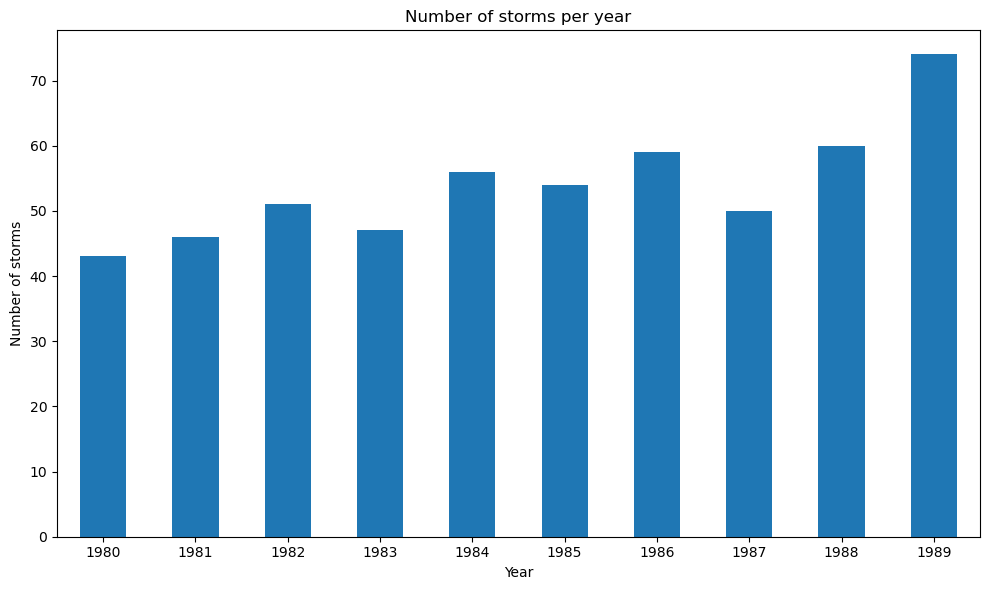

In [318]:
storms_per_year = df.groupby('YEAR')['SID'].nunique()

# Plot the result
storms_per_year.plot(kind='bar', figsize=(10, 6))
plt.title('Number of storms per year')
plt.xlabel('Year')
plt.ylabel('Number of storms')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Thus, we have data on storms from 1980 to 1989, and the number of storms gradually increased throughout this period, reaching its peak in 1989.

Now, let's take a closer look at the categorization of storms in each year.

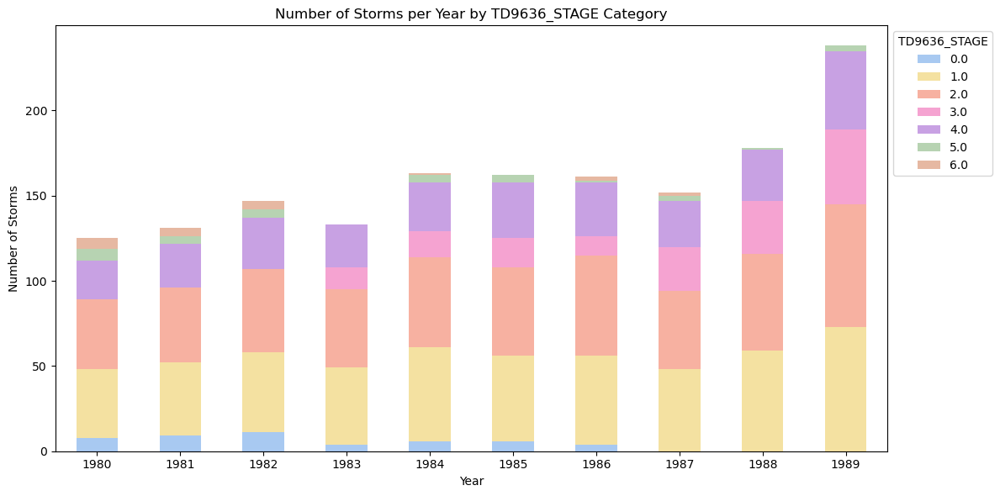

In [322]:
# Group by YEAR and TD9636_STAGE to count occurrences of each stage per year
storms_per_year_stage = df.groupby(['YEAR', 'TD9636_STAGE'])['SID'].nunique().unstack(fill_value=0)

# Define custom colors: 
# 0 - Light Blue, 1 to 5 - Yellow to Red gradient, 6 - Dark Blue
colors = {
    0: '#a8c9f1',  # Light Blue
    1: '#f4e1a1',  # Light Yellow
    2: '#f7b1a1',  # Light Coral
    3: '#f5a3d1',  # Light Pink
    4: '#c8a1e3',  # Light Lavender
    5: '#b7d3b2',  # Light Green
    6: '#e6b8a2'   # Light Peach
}


# Plot stacked bar chart
storms_per_year_stage.plot(kind='bar', stacked=True, figsize=(12, 6), color=[colors[i] for i in storms_per_year_stage.columns])

# Customize labels and layout
plt.title('Number of Storms per Year by TD9636_STAGE Category')
plt.xlabel('Year')
plt.ylabel('Number of Storms')
plt.xticks(rotation=0)
plt.legend(title="TD9636_STAGE", loc="upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show the plot
plt.show()

Here we can clearly see that categories 0, 5, and 6 are significantly lower than the others. Also, after 1986, there are no storms of category 0, and storms of category 3 appear only from 1983 onwards.

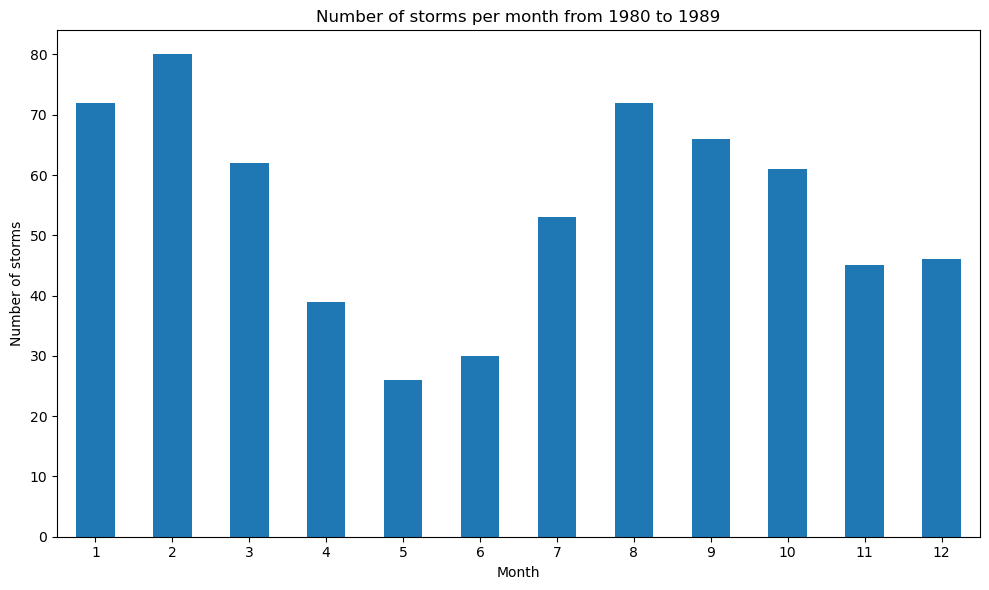

In [325]:
storms_per_month = df.groupby('MONTH')['SID'].nunique()

storms_per_month.plot(kind='bar', figsize=(10, 6))
plt.title('Number of storms per month from 1980 to 1989')
plt.xlabel('Month')
plt.ylabel('Number of storms')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

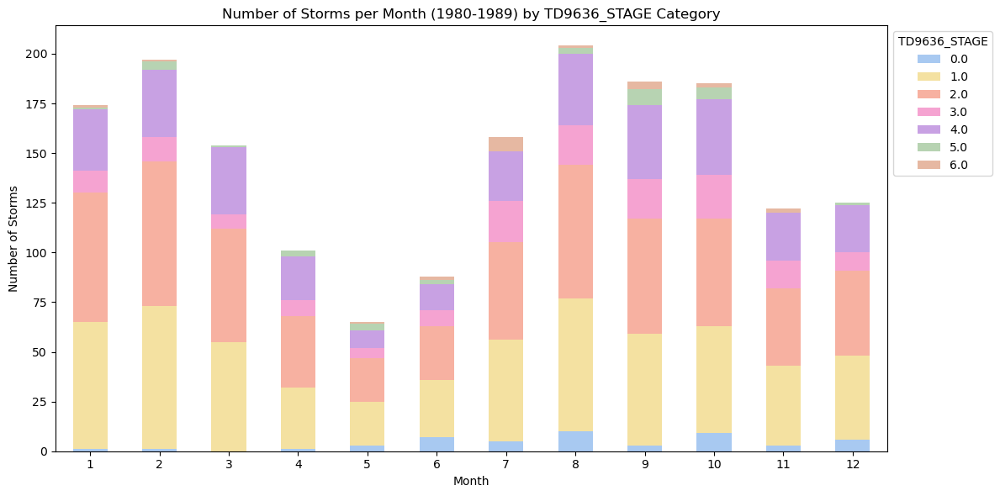

In [327]:
# Filter data for the period 1980-1989
df_filtered = df[(df['YEAR'] >= 1980) & (df['YEAR'] <= 1989)]

# Group by MONTH and TD9636_STAGE to count occurrences of each stage per month
storms_per_month_stage = df_filtered.groupby(['MONTH', 'TD9636_STAGE'])['SID'].nunique().unstack(fill_value=0)

# Define custom colors:
colors = {
    0: '#a8c9f1',  # Light Blue
    1: '#f4e1a1',  # Light Yellow
    2: '#f7b1a1',  # Light Coral
    3: '#f5a3d1',  # Light Pink
    4: '#c8a1e3',  # Light Lavender
    5: '#b7d3b2',  # Light Green
    6: '#e6b8a2'   # Light Peach
}

# Plot stacked bar chart
storms_per_month_stage.plot(kind='bar', stacked=True, figsize=(12, 6), color=[colors[i] for i in storms_per_month_stage.columns])

# Customize labels and layout
plt.title('Number of Storms per Month (1980-1989) by TD9636_STAGE Category')
plt.xlabel('Month')
plt.ylabel('Number of Storms')
plt.xticks(rotation=0)
plt.legend(title="TD9636_STAGE", loc="upper left", bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show the plot
plt.show()


Let's take a look at the average number of storms per month.

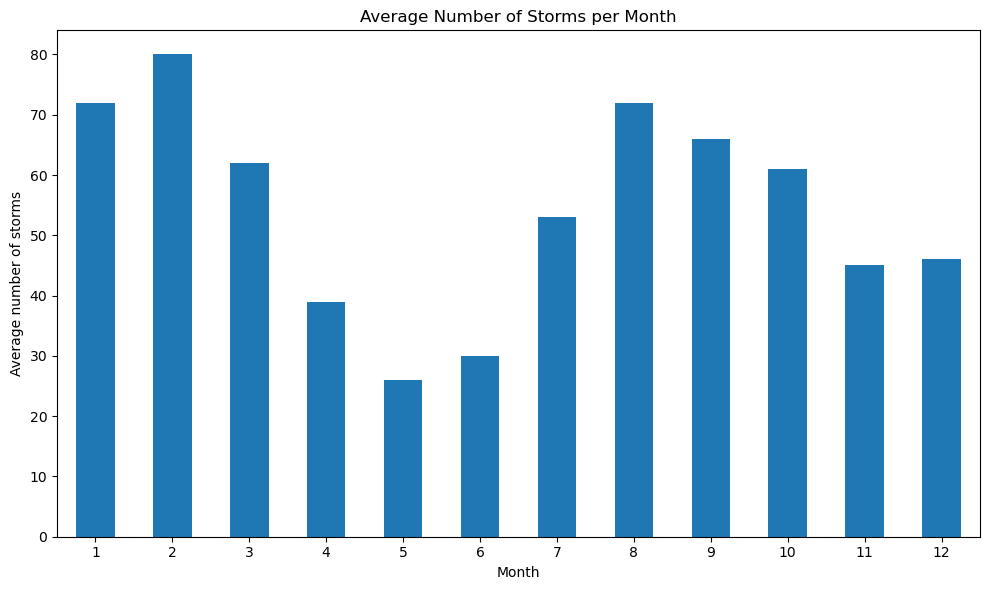

In [330]:
storms_per_year_month = df.groupby(by = ['YEAR', 'MONTH'])['SID'].nunique()
average_storms_per_month = storms_per_month.groupby('MONTH').mean()

# Plot stacked bar chart
average_storms_per_month .plot(kind='bar', figsize=(10, 6))
plt.title('Average Number of Storms per Month')
plt.xlabel('Month')
plt.ylabel('Average number of storms')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

The pattern completely matches what we observed when counting the total for each month throughout the entire period under consideration.

Since the previous section revealed a relationship between latitude and month, let's take a look at the box plot.

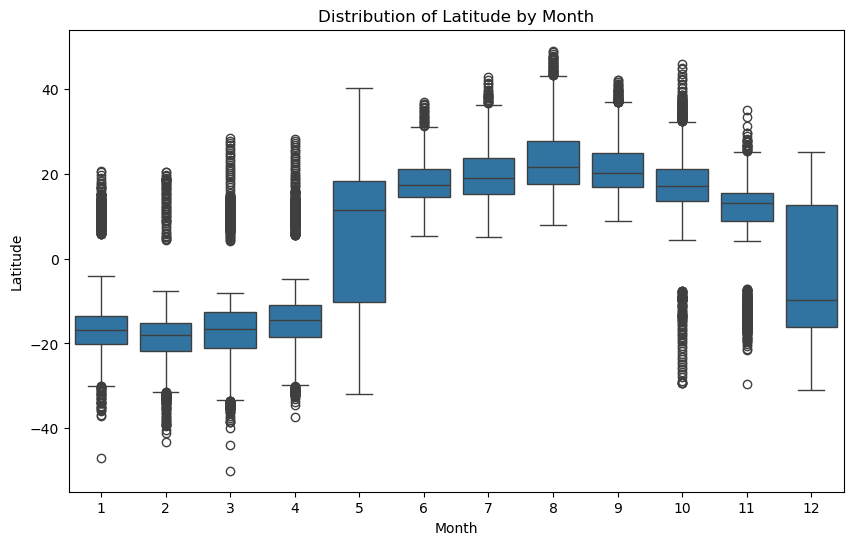

In [334]:
plt.figure(figsize=(10,6))
sns.boxplot(x=df['MONTH'], y=df['LAT'])
plt.title('Distribution of Latitude by Month')
plt.xlabel('Month')
plt.ylabel('Latitude')
plt.show()


We can see that from May to November, the median is close to 20, while from December to April, the median is closer to -20. This means that from May to November, storms mostly occurred in the Northern Hemisphere, while from December to April, they occurred in the Southern Hemisphere. Additionally, these values indicate that the storms were relatively close to the equator (latitude equals zero).

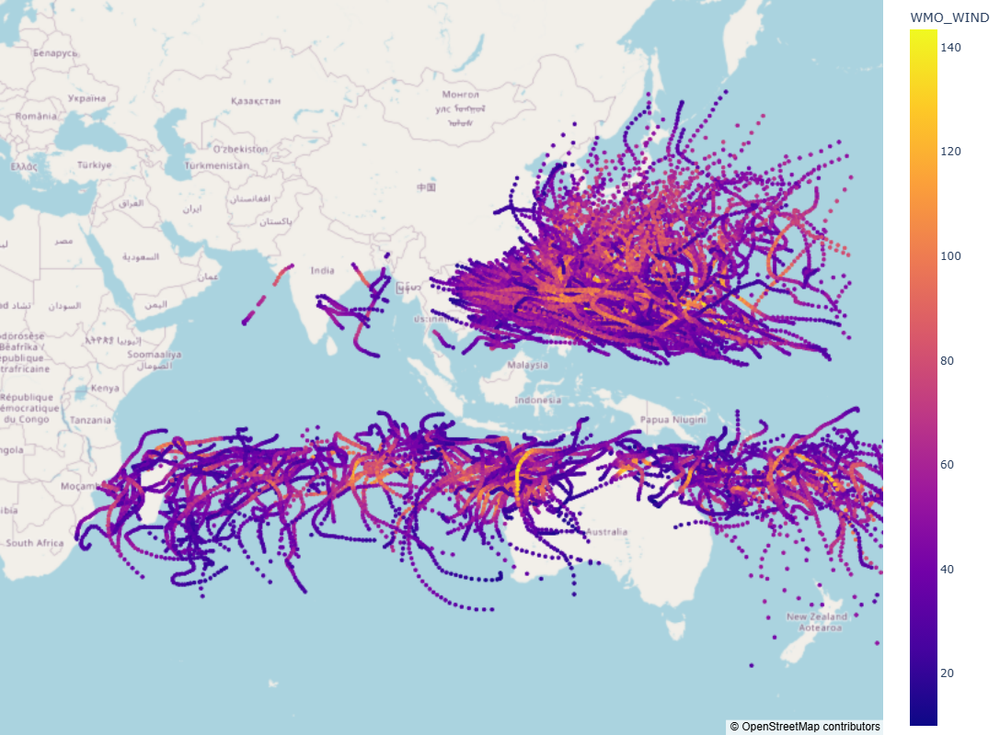

In [337]:
df["TD9636_STAGE"] = pd.to_numeric(df["TD9636_STAGE"], errors='coerce')
df_filtered = df[(df["TD9636_STAGE"] >= 1) & (df["TD9636_STAGE"] <= 5)]
fig = px.scatter_mapbox(df_filtered, lat="LAT", lon="LON", hover_data=["SID","TD9636_STAGE", "YEAR","MONTH"],
                        color_discrete_sequence=["fuchsia"], zoom=2, height=800,color="WMO_WIND")
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

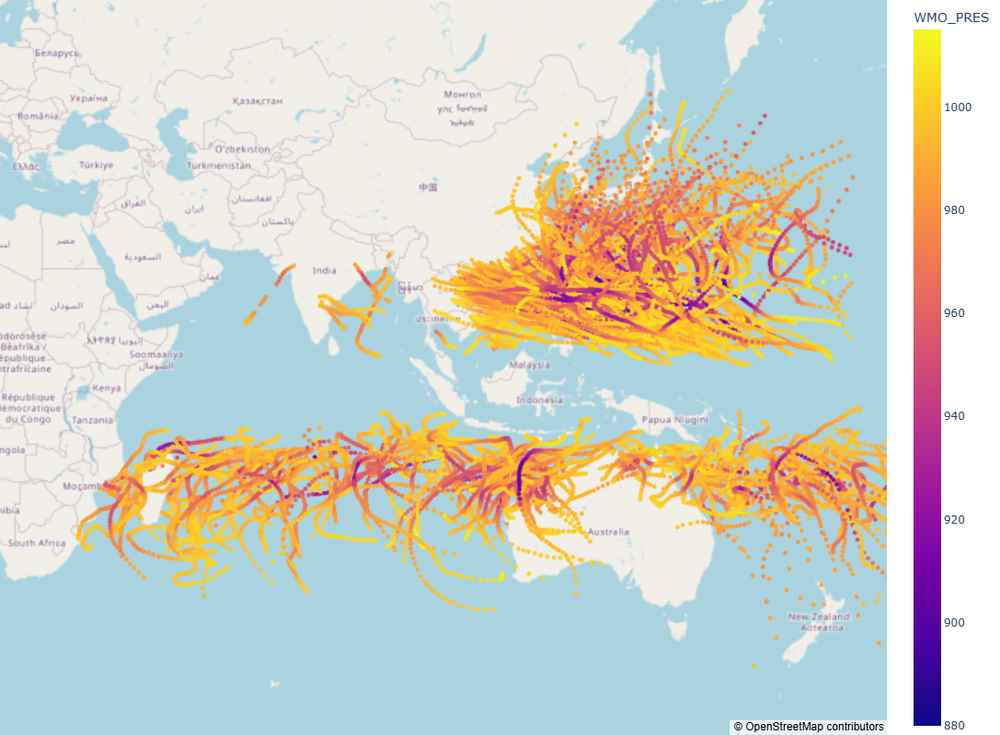

In [338]:
df["TD9636_STAGE"] = pd.to_numeric(df["TD9636_STAGE"], errors='coerce')
df_filtered = df[(df["TD9636_STAGE"] >= 1) & (df["TD9636_STAGE"] <= 5)]
fig = px.scatter_mapbox(df_filtered, lat="LAT", lon="LON", hover_data=["SID","TD9636_STAGE", "YEAR","MONTH"],
                        color_discrete_sequence=["fuchsia"], zoom=2, height=800,color="WMO_PRES")
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### 3.3. Removing Columns for Machine Learning

In [70]:
df = df.drop(['SID','YEAR','NAME','WMO_AGENCY','USA_WIND', 'TOKYO_WIND', 'CMA_WIND', 'HKO_WIND', 'NEWDELHI_WIND', 'REUNION_WIND','BOM_WIND','WELLINGTON_WIND','DS824_WIND','TD9636_WIND','NEUMANN_WIND','USA_PRES', 'TOKYO_PRES', 'CMA_PRES', 'HKO_PRES', 'NEWDELHI_PRES', 'REUNION_PRES','BOM_PRES','WELLINGTON_PRES','DS824_PRES','NEUMANN_PRES'], axis=1)

## 4. Feature Engineering and encoding of the non numerical columns

In [71]:
df.head(3)

,BASIN,SUBBASIN,NATURE,MONTH,LAT,LON,WMO_WIND,WMO_PRES,DIST2LAND,USA_SSHS,TD9636_STAGE,STORM_SPEED,STORM_DIR
9,SP,MM,TS,1,-11.2,173.0,30.00,997.0,767,-1,1.0,3.0,130.0
10,SP,MM,TS,1,-11.3,173.1,36.96,995.0,770,-1,1.0,4.0,150.0
11,SP,MM,TS,1,-11.6,173.2,39.20,994.0,762,-1,1.0,5.0,150.0


In [72]:
# Encoding categorical features
df = pd.get_dummies(df, columns=['BASIN', 'SUBBASIN', 'USA_SSHS', 'MONTH', 'NATURE'])

# Scaling numerical features
num_features = ['LAT', 'LON', 'WMO_WIND', 'WMO_PRES', 'DIST2LAND']
scaler = StandardScaler()
df[num_features] = scaler.fit_transform(df[num_features])

We converted the categorical variables (BASIN and SUBBASIN) into numerical format using one-hot encoding, since there is no natural ordering for these columns. As for the rest of the columns we used StandardScaler so that it ensures all features have the same scale, preventing large-scale values (like YEAR) from dominating the model.

In [73]:
#Checking if all columns are numerical before proceeding to the training model
print(df.dtypes)

#Converting the boolean columns into integers
df = df.astype({col: 'int64' for col in df.select_dtypes(include='bool').columns})

LAT             float64
LON             float64
WMO_WIND        float64
WMO_PRES        float64
DIST2LAND       float64
TD9636_STAGE    float64
STORM_SPEED     float64
STORM_DIR       float64
BASIN_EP           bool
BASIN_NI           bool
BASIN_SI           bool
BASIN_SP           bool
BASIN_WP           bool
SUBBASIN_AS        bool
SUBBASIN_BB        bool
SUBBASIN_CP        bool
SUBBASIN_EA        bool
SUBBASIN_MM        bool
SUBBASIN_WA        bool
USA_SSHS_-5        bool
USA_SSHS_-1        bool
USA_SSHS_0         bool
USA_SSHS_1         bool
USA_SSHS_2         bool
USA_SSHS_3         bool
USA_SSHS_4         bool
USA_SSHS_5         bool
MONTH_1            bool
MONTH_2            bool
MONTH_3            bool
MONTH_4            bool
MONTH_5            bool
MONTH_6            bool
MONTH_7            bool
MONTH_8            bool
MONTH_9            bool
MONTH_10           bool
MONTH_11           bool
MONTH_12           bool
NATURE_DS          bool
NATURE_ET          bool
NATURE_MX       

## 5. Trying a model

Our situation is the following: we want to predict the severity of a depression, storm. Our target are categories ranging from 0 to 6. :
- 0 tropical disturbance
- 1 depression with winds < 34knots
- 2 storm with winds between 34 to 63 knots
- 3 point where wind reached 64 knots
- 4 hurricane with winds > 64 knots
- 5 Extratropical storm
- 6 Dissipating Storm

We can already see what worst outcomes could be for our models:
- First, it would be to have false positives () when identifying a storm as being a simple depression, while it is in fact something worse (storm or hurricane for example). Therefore, for the category 0, 1 or 2 precision is more "critical" than the recall, even though recall remains really important to assess how good our model is at finding all the categories present in the test datasets.
- Second, it would be for the worst storm, typically category 4 to be "missed" by the model. Hence, false negatives would be dramatic in this case, for example flagging a storm as being a depression while it is actually a hurricane. Therefore, for category 4 recall seems to be more critical as recall assess the false negatives, even though precision stills remain super important (flagging a hurricane while it's in fact not a hurricane is still not good, yet it would endanger less human lives than a false negative).
- Lastly, about the category 3 which identify the storms we believe that precision and recall are as important as the other given the "center" stage that this category holds.

We also have to take into account that category 0, 3, 5 and 6 are extremely underrepresented in our dataset, representing respectively 0.8%, 2%, 0.7% and 0.2% of the dataset, the machine learning algorithms will likely be less good at predicting them then the others categories. Nonetheless, they represent less "dangerous" or critical categories. The most important categories to be flagged by our algorithm are the most dangerous, which are category 4, 3 and 2.

In [74]:
# Define target variable
target = 'TD9636_STAGE'
X = df.drop(columns=[target])  # Features
y = df[target].copy()  # Target variable

# Split the dataset (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

print(f"Training set: {X_train.shape}, Testing set: {X_test.shape}")


Training set: (21660, 43), Testing set: (5415, 43)


### 5.1 Logistic Regression model

In [75]:
model = LogisticRegression(solver='lbfgs', max_iter=5000, random_state = 0)
# Train the model
model.fit(X_train, y_train)

# Generate predictions
y_pred = model.predict(X_test)

# Calculation of the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{cm}\n')

# Evaluate performance
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division = 0))

Confusion Matrix:
[[  21   30    3    0    0    0    0]
 [   8 1220  180    0   12    3    0]
 [   0  205 1983    2   86    4    0]
 [   0    0    5    4   98    0    0]
 [   0    1  182    5 1321    0    0]
 [   0    2    4    0    0   27    0]
 [   1    5    1    0    0    1    1]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.39      0.50        54
         1.0       0.83      0.86      0.85      1423
         2.0       0.84      0.87      0.86      2280
         3.0       0.36      0.04      0.07       107
         4.0       0.87      0.88      0.87      1509
         5.0       0.77      0.82      0.79        33
         6.0       1.00      0.11      0.20         9

    accuracy                           0.85      5415
   macro avg       0.77      0.57      0.59      5415
weighted avg       0.84      0.85      0.84      5415



/Users/oksana/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



The linear model provides a very good accuracy of 85%. Precision for class 0, 1 and 2 is at 70%, 84% and 84% which is good but could be better using a more suited model.
Another good point is that the recall for the category 4 is 88%.

Nonetheless, The linear regression doesn't seem to be able to figure out the category 3 (3% recall).

Also we can see through the confusion matrix that for the hurricane category 181 were flagged as being storm (category 2). This highlight exactly the worst points we discussed before, which would be to have a false positives for category 1 and 2 and false negative for the category 3 or 4, the model flagging the depressions as being storms, while they're actually hurricanes.

#### 5.1.1 Model Overfitting


In [76]:
# Predictions
train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

# Scores
train_score = accuracy_score(y_train, train_preds)
test_score = accuracy_score(y_test, test_preds)

print(f"Score train data : {train_score:.3f}")
print(f"Score test data : {test_score:.3f}")

Score train data : 0.849
Score test data : 0.845


The model though seems to be performing in a similar way whether on the training or testing phase which doesn't indicate any overfitting which is positive.

#### 5.1.2 Data Augmentation

Since some categories have significantly fewer examples than others, the model may not adequately focus on the minority classes, leading to biased results. To address this, we use data augmentation techniques.

In [77]:
# Initialize the SMOTE object
method = SMOTE()

# Resample the training data
X_resampled, y_resampled = method.fit_resample(X_train, y_train)

# Fit the Logistic Regression model on the resampled data
model = LogisticRegression(solver='lbfgs', max_iter=5000, random_state = 0)
model.fit(X_resampled, y_resampled)

# Get predictions on the test data
predicted = model.predict(X_test)

# Calculation of the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{cm}\n')

# Evaluate performance
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division = 0))


Confusion Matrix:
[[  21   30    3    0    0    0    0]
 [   8 1220  180    0   12    3    0]
 [   0  205 1983    2   86    4    0]
 [   0    0    5    4   98    0    0]
 [   0    1  182    5 1321    0    0]
 [   0    2    4    0    0   27    0]
 [   1    5    1    0    0    1    1]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.39      0.50        54
         1.0       0.83      0.86      0.85      1423
         2.0       0.84      0.87      0.86      2280
         3.0       0.36      0.04      0.07       107
         4.0       0.87      0.88      0.87      1509
         5.0       0.77      0.82      0.79        33
         6.0       1.00      0.11      0.20         9

    accuracy                           0.85      5415
   macro avg       0.77      0.57      0.59      5415
weighted avg       0.84      0.85      0.84      5415



/Users/oksana/anaconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



1. Confusion Matrix:

SMOTE improved the prediction of minority classes, especially class 0 and class 5.
Without SMOTE, class 0 was poorly predicted, while SMOTE ensured perfect prediction for class 0.

2. Accuracy:

The accuracy improved from 0.85 (without SMOTE) to 0.87 (with SMOTE), reflecting better overall performance.

3. Recall for Minority Classes:

SMOTE significantly boosted recall for class 0 (from 0.39 to 1.00) and class 5 (from 0.82 to 0.94).

4. Class 3 Performance:

Class 3 still struggled, with low precision and recall, despite the use of SMOTE.

5. Macro & Weighted Averages:

SMOTE improved the macro average recall (from 0.57 to 0.87) and the weighted average F1-score (from 0.84 to 0.88).

***Conclusion:*** SMOTE effectively balanced the dataset, improving model performance, especially for minority classes, though challenges remain with certain classes like class 3.

#### 5.1.3 Model Overfitting

In [78]:
train_acc = model.score(X_resampled, y_resampled)  # Accuracy на обучающей выборке
test_acc = model.score(X_test, y_test)  # Accuracy на тестовой выборке

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


Train Accuracy: 0.8608
Test Accuracy: 0.8170


The model though seems to be performing in a similar way whether on the training or testing phase which doesn't indicate any overfitting which is positive.

### 5.2 Decision Tree model


In [79]:
model = DecisionTreeClassifier(random_state = 0)

# Train the model
model.fit(X_train, y_train)

# Generate predictions
y_pred = model.predict(X_test)

# Calculation of the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{cm}\n')

# Evaluate performance
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division =0))

Confusion Matrix:
[[  45    6    3    0    0    0    0]
 [   3 1276  140    0    2    1    1]
 [   0  179 1991    9   98    2    1]
 [   0    0   11   52   44    0    0]
 [   0    3   86   39 1380    1    0]
 [   0    2    6    0    1   24    0]
 [   0    2    1    0    0    0    6]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.83      0.88        54
         1.0       0.87      0.90      0.88      1423
         2.0       0.89      0.87      0.88      2280
         3.0       0.52      0.49      0.50       107
         4.0       0.90      0.91      0.91      1509
         5.0       0.86      0.73      0.79        33
         6.0       0.75      0.67      0.71         9

    accuracy                           0.88      5415
   macro avg       0.82      0.77      0.79      5415
weighted avg       0.88      0.88      0.88      5415



We tried a linear model, the logistic regression, but would like now to try out a non-linear model, more complex and likely more suited to our classification problem.
The decision tree model seems to be more fitted to study our dataset compared to the logistic regression. With a 88% overall accuracy, even if it failed at finding all the under-represented classes, it's already closer than the logistic regression, especially with regards to the category 3, which has a recall of 49%, much better than the 3% of the linear regression.. We will keep on exploring with two one models to see if we could get better results.
Indeed, precision for category 0, 1 and 2 increases to 94%, 87% and 89%. Recall for the category 3 and 4 jumps 49% and 91% which is better as well.

When looking more in detail at the confusion matrix we can see that they are less false positives for the category 0, 1 and 2.
The results of this model just seem better than de logistic regression in most regards.

#### 5.2.1. Model Overfitting

In [80]:
# Prédictions
train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

# Scores
train_score = accuracy_score(y_train, train_preds)
test_score = accuracy_score(y_test, test_preds)

print(f"Score train data : {train_score:.3f}")
print(f"Score test data : {test_score:.3f}")

Score train data : 1.000
Score test data : 0.882


Here it seems though, compared to the linear regression, that the model is overfitting the data because as we can see the model has a 100% accuracy on the training set while 88% on the testing set which indicates overfitting.

### 5.3 Trying the Random Forest Model

In [81]:
# Initialize the classifier
model = RandomForestClassifier(random_state = 0)

# Train the model
model.fit(X_train, y_train)

# Generate predictions
y_pred = model.predict(X_test)

# Calculation of Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{cm}\n')

# Evaluate performance
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division =0))

Confusion Matrix:
[[  46    7    1    0    0    0    0]
 [   0 1309  110    0    2    2    0]
 [   0  105 2137    4   33    1    0]
 [   0    0    4   41   62    0    0]
 [   0    2   90   10 1407    0    0]
 [   0    2    4    0    1   26    0]
 [   0    2    1    0    0    1    5]]

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.85      0.92        54
         1.0       0.92      0.92      0.92      1423
         2.0       0.91      0.94      0.92      2280
         3.0       0.75      0.38      0.51       107
         4.0       0.93      0.93      0.93      1509
         5.0       0.87      0.79      0.83        33
         6.0       1.00      0.56      0.71         9

    accuracy                           0.92      5415
   macro avg       0.91      0.77      0.82      5415
weighted avg       0.92      0.92      0.92      5415



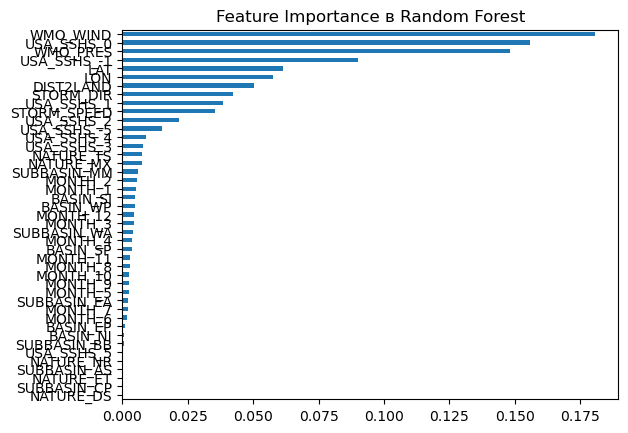

In [82]:
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.sort_values().plot(kind="barh", title="Feature Importance в Random Forest")
plt.show()

Random Forest model seems to be the best at figuring our classification problem.

Overall accuracy jumps to 92%, with a very good precision on category 0,1 and 2 of 100%, 92% and 91% respectively. We can see this in the confusion matrix that the false positives for those categories are occurring less often.

Regarding the category 3 and 4 it did found 40% and 93% of it, which is good as well, with a 75% precision for category 3. Even though the recall for category 3 is lower than in the decision tree modelling, the precision being much higher (52% vs 75%) it seems like a reasonable bargain. Part of the reason is in what this class actually represents. While category 2 represents storm where wind reached 34-63knots, category 3 represents a point where wind reached 64 knots and category 3 represents the hurricanes where winds gets higher than 64 knots. Category 3 kind of is in the middle of two much bigger category, and is much more "subtle", meaning harder to detect by the ML algorithm. Adding the fact that the class is underrepresented in the population, we can make sense of the models results having trouble to figure out this class. Yet, looking at the results and the different classes we're trying to forecast, category 3 isn't as important as category 2 or 4 which actually represents the biggest, most frequent and most dangerous storms.

This is why we believe that, given the first results, without tuning any models, that the Random Forest Classifier could be the best model out of the 3 tested for our problem.

#### 5.3.1. Model Overfitting

Unfortunately though, the model does seem to overfitt the data as well. With a training score of 100% and a testing score of 92%. We'll attempt now at reducing the overfitting of the Random Forest Model by tuning it.


In [83]:
# Prédictions
train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

# Scores
train_score = accuracy_score(y_train, train_preds)
test_score = accuracy_score(y_test, test_preds)

print(f"Score train data : {train_score:.3f}")
print(f"Score test data : {test_score:.3f}")

Score train data : 1.000
Score test data : 0.918


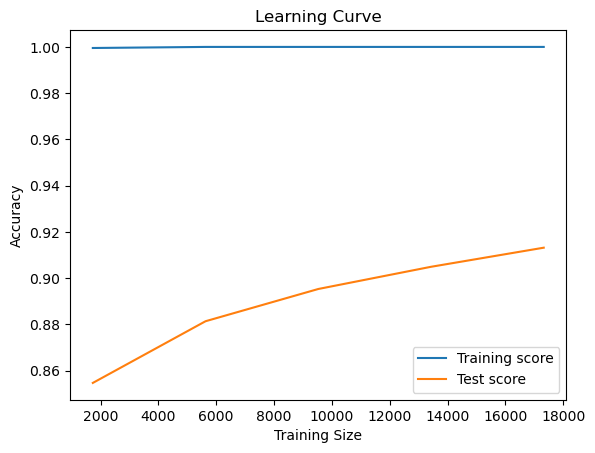

In [84]:
train_sizes, train_scores, test_scores = learning_curve(
    model, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

# Plot learning curve
plt.plot(train_sizes, train_scores.mean(axis=1), label="Training score")
plt.plot(train_sizes, test_scores.mean(axis=1), label="Test score")
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()

### 5.4 Tuning of the Random Forest Model
The question left standing though is the following: would it be performant only for our dataset because it trained on it (overfitting) or would it be good enough to generalize its finding to other datasets? Taking into consideration that our data set is filled with data that is from the 1980s, it is possible that if we were to look at storm data of the last 10 years, there might be subtle change. In case our algorithm was to try to forecast more recent data, we believe that keeping flexibility (meaning less overfitting) at the cost of a slightly lower performance is in our case beneficial.

The findings in 3.3.1 leave us to believe that the model does overfit, and because of that we'll attempt by using the hyperparameters to reduce the overfitting without losing too much performance.

Increasing the number of estimators, increase the number of trees that the algorithm will go through, should allow the model to be more precise even though longer to be trained. Class weight "balanced" helps adjusting and taking into account our underrepresented classes. While min samples split and min samples leaf are both trying to control the overfitting of the model.

The conclusion of the tuning part is that the overfitting got reduced a bit as we can see, yet it did cost some performance point. Therefore, as expected and aimed for, our tuned random forest model provides less performance on this dataset compare to an un-tuned random forest classifier model, yet it is less overfitting the data, meaning more flexible and likely better at predicting other data, more recent data for instance.

In [85]:
# Initialize the classifier
model = RandomForestClassifier(n_estimators= 500, max_depth = 20, class_weight = "balanced", min_samples_split = 5, min_samples_leaf = 6, random_state = 0)

# Train the model
model.fit(X_train, y_train)

# Generate predictions
y_pred = model.predict(X_test)

# Calcul de la matrice de confusion
cm = confusion_matrix(y_test, y_pred)
print(f'Matrice de Confusion:\n{cm}\n')

# Evaluate performance
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division =0))

Matrice de Confusion:
[[  54    0    0    0    0    0    0]
 [  45 1249  114    0    6    2    7]
 [   2  164 2007   30   50   23    4]
 [   0    0    3   67   37    0    0]
 [   0    1  117   99 1291    1    0]
 [   1    1    0    0    0   30    1]
 [   0    0    0    0    0    1    8]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.53      1.00      0.69        54
         1.0       0.88      0.88      0.88      1423
         2.0       0.90      0.88      0.89      2280
         3.0       0.34      0.63      0.44       107
         4.0       0.93      0.86      0.89      1509
         5.0       0.53      0.91      0.67        33
         6.0       0.40      0.89      0.55         9

    accuracy                           0.87      5415
   macro avg       0.64      0.86      0.72      5415
weighted avg       0.88      0.87      0.87      5415



In [86]:
# Prédictions
train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

# Scores
train_score = accuracy_score(y_train, train_preds)
test_score = accuracy_score(y_test, test_preds)

print(f"Score on training data: {train_score:.3f}")
print(f"Score on test data: {test_score:.3f}")

Score on training data: 0.892
Score on test data: 0.869


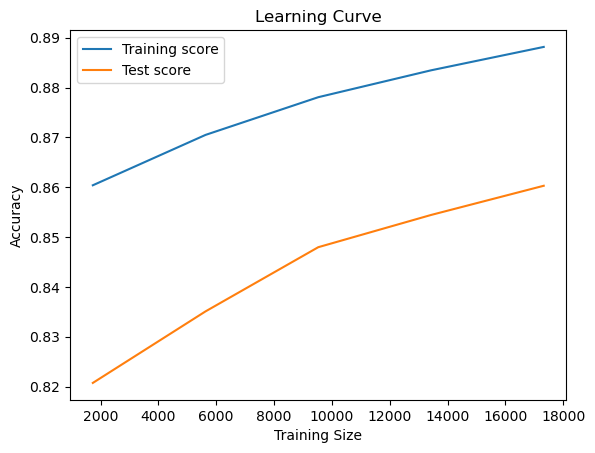

In [87]:

train_sizes, train_scores, test_scores = learning_curve(
    model, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1
)

# Plot learning curve
plt.plot(train_sizes, train_scores.mean(axis=1), label="Training score")
plt.plot(train_sizes, test_scores.mean(axis=1), label="Test score")
plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Learning Curve')
plt.show()


#### 5.4.1 Features performances for df

Let's have a look at which features explain the most the findings of the Random Forest model.

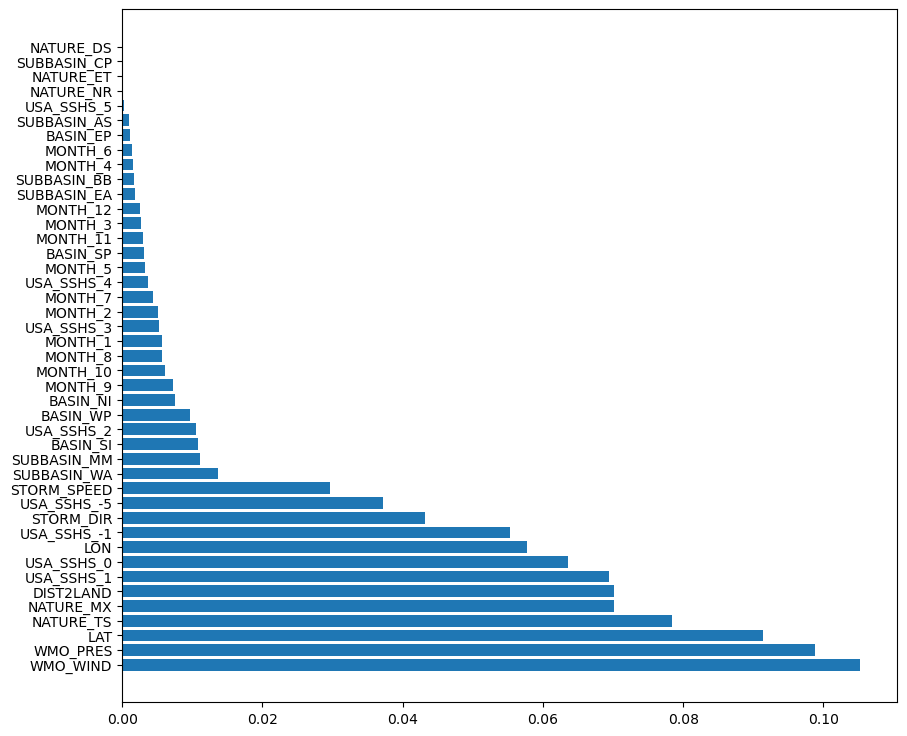

In [88]:
# Get the feature importance values for df
importance = model.feature_importances_

# If X_train is a DataFrame, you can use the feature names (columns) directly
features = X_train.columns

# Create a DataFrame for better visualization
feature_importance = pd.DataFrame({'Feature': features, 'Importance': importance})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 9))
plt.barh(feature_importance['Feature'], feature_importance['Importance'])
plt.show()

### 5.5 Removing of the non impactful columns

The conclusion of this part is that by removing the not usefull features to the model, even if likely not significant, we improved very slightly the performances of it of the model.

In [89]:
X_train = X_train.drop(columns = ['NATURE_DS', 'SUBBASIN_CP', 'NATURE_ET', 'NATURE_NR', 'USA_SSHS_5'])
X_test = X_test.drop(columns = ['NATURE_DS', 'SUBBASIN_CP', 'NATURE_ET', 'NATURE_NR', 'USA_SSHS_5'])

In [90]:
# Initialize the classifier
model = RandomForestClassifier(random_state = 0)

# Train the model
model.fit(X_train, y_train)

# Generate predictions
y_pred = model.predict(X_test)

# Calcul de la matrice de confusion
cm = confusion_matrix(y_test, y_pred)
print(f'Matrice de Confusion:\n{cm}\n')

# Evaluate performance
acc = accuracy_score(y_test, y_pred)
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division =0))

Matrice de Confusion:
[[  47    6    1    0    0    0    0]
 [   0 1314  106    0    1    2    0]
 [   0  106 2137    4   33    0    0]
 [   0    0    3   44   60    0    0]
 [   0    2   93   10 1404    0    0]
 [   0    2    5    0    1   25    0]
 [   0    1    1    0    0    1    6]]

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.87      0.93        54
         1.0       0.92      0.92      0.92      1423
         2.0       0.91      0.94      0.92      2280
         3.0       0.76      0.41      0.53       107
         4.0       0.94      0.93      0.93      1509
         5.0       0.89      0.76      0.82        33
         6.0       1.00      0.67      0.80         9

    accuracy                           0.92      5415
   macro avg       0.92      0.79      0.84      5415
weighted avg       0.92      0.92      0.92      5415



In [91]:
# Prédictions
train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

# Scores
train_score = accuracy_score(y_train, train_preds)
test_score = accuracy_score(y_test, test_preds)

print(f"Score on training data: {train_score:.3f}")
print(f"Score on test data: {test_score:.3f}")

Score on training data: 1.000
Score on test data: 0.919


In [92]:
# Initialize the classifier
model = RandomForestClassifier(n_estimators= 500, max_depth = 20, class_weight = "balanced", min_samples_split = 5, min_samples_leaf = 6, random_state = 0)

# Train the model
model.fit(X_train, y_train)

# Generate predictions
y_pred = model.predict(X_test)

# Calcul de la matrice de confusion
cm = confusion_matrix(y_test, y_pred)
print(f'Matrice de Confusion:\n{cm}\n')

# Evaluate performance
print("Classification Report:")
print(classification_report(y_test, y_pred, zero_division =0))

Matrice de Confusion:
[[  54    0    0    0    0    0    0]
 [  41 1254  113    0    6    2    7]
 [   2  163 2012   29   46   24    4]
 [   0    0    3   66   38    0    0]
 [   0    1  114   91 1302    1    0]
 [   0    1    0    0    0   31    1]
 [   0    0    0    0    0    1    8]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.56      1.00      0.72        54
         1.0       0.88      0.88      0.88      1423
         2.0       0.90      0.88      0.89      2280
         3.0       0.35      0.62      0.45       107
         4.0       0.94      0.86      0.90      1509
         5.0       0.53      0.94      0.67        33
         6.0       0.40      0.89      0.55         9

    accuracy                           0.87      5415
   macro avg       0.65      0.87      0.72      5415
weighted avg       0.89      0.87      0.88      5415



In [93]:
# Predictions
train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

# Scores
train_score = accuracy_score(y_train, train_preds)
test_score = accuracy_score(y_test, test_preds)

print(f"Score on training data: {train_score:.3f}")
print(f"Score on test data: {test_score:.3f}")

Score on training data: 0.896
Score on test data: 0.873


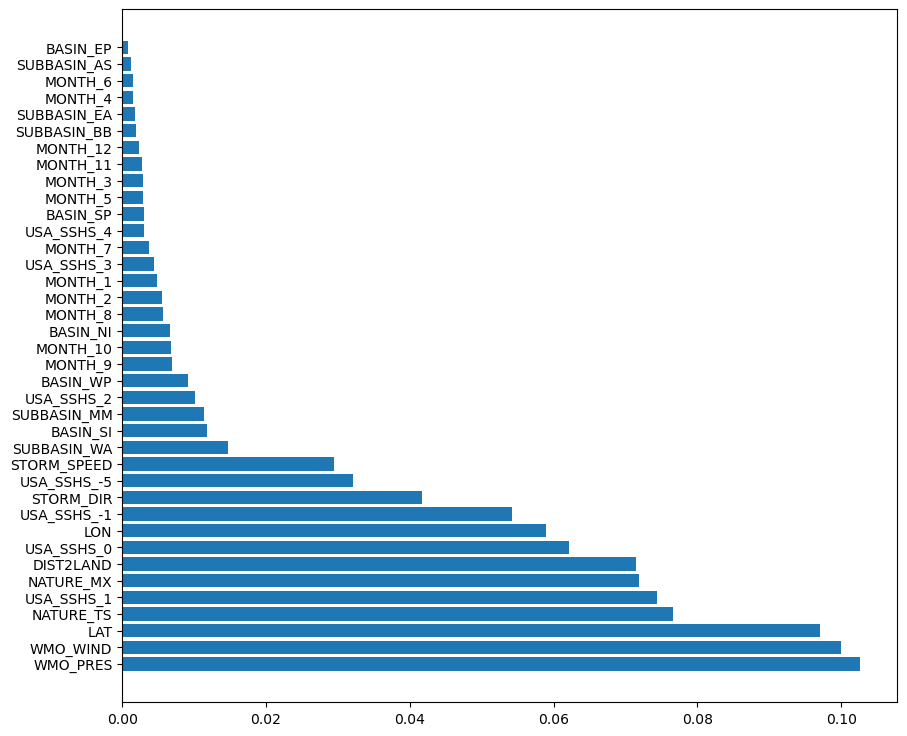

In [94]:
# Get the feature importance values for df
importance = model.feature_importances_

# If X_train is a DataFrame, you can use the feature names (columns) directly
features = X_train.columns

# Create a DataFrame for better visualization
feature_importance = pd.DataFrame({'Feature': features, 'Importance': importance})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 9))
plt.barh(feature_importance['Feature'], feature_importance['Importance'])
plt.show()

To sum up the features importance

**Most important features** – `WMO_PRES`, `WMO_WIND`, `LAT`, `NATURE_TS`, `NATURE_MX`, and `DIST2LAND`.
This means that pressure, wind speed, latitude, and storm characteristics have the strongest influence on the predictions.

**Least important features** – `BASIN_EP`, `SUBBASIN_AS`, `MONTH_6`, `SUBBASIN_BB`, `MONTH_11`. These variables contribute very little to the model.

**Region-related categories** (`BASIN`, `SUBBASIN`, `USA_SSHS`) are less important compared to numerical storm characteristics like wind speed and pressure.

**Time-related variables** (`MONTH_X`) have a relatively low impact, suggesting that the time of year does not strongly affect the predictions.

Longitude (`LON`) is less important than latitude (`LAT`), meaning storms might be more influenced by their position relative to the equator rather than east-west location.


***So Overall Summary***:
- The model focuses on physical storm characteristics (pressure, wind, coordinates).
- Time and region have a weak influence.

## 6. Key Findings

### Predisposition with the dataset  

#### Understanding the large amounts of columns and rows 

The IBTrACS dataset has initially 174 columns and 297 098 rows after removing the description of the features under the headers which consist of a large amount of data.  

This is due to the fact that for each row of the dataset corresponding to a specific location on earth (junction of latitude and longitude) where the data of a storm has been record at a specific time. The data provided in IBTrACS is interpolated to 3-hourly data.  

The large number of columns is due to the fact that the different variables of the storms (type, wind speed, pressure even wind radii maximum extent in the different quadrant of it) are provided by 15 agencies dispatched all around the world. 

Thus, the dataset allows users to follow the evolution of a cyclone from start to finish in a 3-hourly interval.  

#### Pre-selection of relevant columns 

The project presents a challenge not only due to its subject matter but also because of the large number of columns and rows to manage. To address this issue, a significant portion of the exploratory data analysis (EDA) was dedicated to reviewing the default documentation provided with the dataset, which describes the columns. Additionally, following the instructor’s recommendation, we sought more comprehensive documentation. 

By examining these two key documents: 

Technical Documentation: Caveats, usage information, and other details about how to use and apply IBTrACS data. 

V04r01 Column Documentation: Description of each CSV and shapefile data column 

We have been able to process the preselection of the columns that seem to be relevant for the EDA and the model.  

As a result, the dataset contains 297 098 rows and 49 columns. 

### Amount of missing data in the pre-selected columns 

After the changeset of type for the string, numerical and time columns, we has been able to count the amount of missing values in our dataset.  

The IBTrACS dataset contains 50 columns with missing values ranging from 0% to 100%, which is expected. It integrates historical and recent storm data from multiple global agencies, each covering different regions, time periods, and storm types. While the dataset spans from 1980 to 2024 (2025 in season years), some agencies provide older historical data dating back to the 19th century.  

Each row in the dataset represents a specific storm point, including longitude, latitude, and other attributes. Time intervals vary by agency, with most data recorded at 6-hour intervals, though some agencies provide 3-hour intervals or event-specific timestamps (e.g., landfall times). This variability contributes to the dataset’s missing values. 

Columns with 100% missing values have been removed from the dataset. These primarily include wind speed and pressure data from local agencies. 

### Data processing 

#### Removal of missing values in the target column and initial distribution 

According to the documentation, the TD9636 dataset was compiled by NOAA/National Climatic Center (now NCEI) in the 1960s and 1970s as a global collection of storms from multiple sources. It has not been updated since the 1980s. In IBTrACS, TD9636 data is used for storms outside the North Atlantic and before 1980. 

As a result, the TD9636_STAGE target column contains: 

Data from 1980 to 1989, covering all basins except the North Atlantic. 

83.7% missing values. 

Keeping rows with missing target values could compromise the model’s integrity. Attempting to impute such a high proportion (83.7%) of missing data may introduce systematic biases. Removing these rows ensures that the target variable remains authentic and reliable.  

After the removal of the N/A in the target column, the dataset contains 48 343 rows and 49 columns which represent a total of 793 storms. 


### Feature Engineering & Selection 

Regarding the feature engineering part we decided to keep the columns: 

- `Basin` 
- `Subbasin` 
- `USA_SSHS` 
- `Month`
- `Nature` 
- `Lat` 
- `Lon` 
- `WMO_WIND` 
- `WMO_PRES` 
- `Dist2land` 

We believe that each of these features provides very important information regarding what a disturbance could be, whether it is a simple depression or a hurricane. For instance, the month gives the information of what time of the year are we in and for example hurricanes do more often happened during specifics months of the year. The basin and subbasin give information about the localization of the disturbance. Since storms and hurricanes usually happen in specifics area of the world, this is as well a valuable information to input in the model. Latitude and Longitude provide information as well regarding the positioning of the storm, same as Dist2land but in a different way than Basin and Subbasin are.  

USA_SSHS tells us the hurricane scale, which in some way is similar to our target column TD9636_STAGE, though it is much more precise and subtle than the target.  

Finally, WMO_WIND and WMO_PRES provide recorded wind and pressure information about the storm. We believe these two features to be the most important in our dataset as ultimately a storm will be classified as being a depression, storm or hurricane mostly based on these two features that record the “intensity” of the storm.  

Among those, Basin, Subbasin, USA_SSHS, Month and Nature are all categorical features, which requires to be encoded to be used by the model. The other features, WMO_WIND, WMO_PRES, lat, lon and Dist2land are all numerical features for which no encoding is necessary.  

The target column, TD9636_STAGE, is an ordinal categorical variable, as the categories have a meaningful order based on storm intensity. 

This initial distribution teaches us that stages 1 (depression) and 2 (storm) have the highest counts. This indicates that most storms recorded in the dataset don't intensify beyond the depression or storm stage. There is a significant decrease in the count for stages 3 (winds reaching 64 knots) and 4 (hurricane). This suggests that relatively fewer storms reach the intensity of strong cyclones or hurricanes. Stages 5 (extratropical) and 6 (dissipating) have very low counts which means that extratropical transitions or dissipating storms are not as common. There is no stage 7 (unknown intensity or doubtful track). 

#### Consideration of track type 

The majority of storms fall under the "main" type category. According to the documentation: 

Provisional data is often released early but lacks final confirmation from a complete reanalysis. As a result, it may not always represent the most accurate or stable information, potentially leading to inconsistencies and unreliable predictions. 

Storm spurs arise because IBTrACS aggregates tropical cyclone data from multiple sources, which sometimes report differing storm positions. These discrepancies often stem from observational challenges, such as difficulties in pinpointing the storm's center in an unorganized cloud system. In such cases, spurs represent differing interpretations of the storm's location. 

Given these factors, it is reasonable to exclude other track types and retain only the "main" type. 

### Model Selection, Comparison and Evaluation 

First, as explained in our notebook, we’re aiming at predicting 7 categories for our target column: 

- 0 tropical disturbance, 

- 1 depression with winds < 34knots, 

- 2 storms with winds between 34 to 63 knots, 

- 3 points where wind reached 64 knots, 

- 4 hurricane with winds > 64 knots, 

- 5 Extratropical storms, 

- 6 Dissipating Storm. 

First thing first, regarding our dataset, categories 0, 3, 5 and 6 are much less represented than the others. They each represent respectively 0.8%, 2%, 0.7% and 0.2% of the data set. Most of our data regards depression, storms and hurricanes (category 1, 2 and 4). 

It is understandable because categories 1, 2 and 4 are all “big” categories that encompass a bigger range in terms of criteria compared to the other categories. It therefore makes sense to have more storms (data) falling in these categories than the others. 

#### Evaluation 

How to evaluate our model? Based on those categories, we can already see that some outcomes could be worse than others.  

Indeed, categories 0, 1, 2 and 5 represent disturbances, storms and depression with low to mild dangers regarding human life compared to category 3 or 4 which represent the typing point between which a storm switch to hurricane and actual hurricanes.  

Regarding the first 3 categories, we believe the worst possible outcome for our model would be to predict that it is either one, while in fact it is a much worse storm like a hurricane. For example, if we predict a simple depression and warn people that a depression is on its way, they will not prepare to potential catastrophic damage, and if that depression turns to be a hurricane, the consequences would be dire. Hence, for category 0, 1 and 2 we will focus on the precision since as explained, we believe that false positives are worse than false negatives. Indeed, if we flag a hurricane, warn people so they would get ready, and the hurricane turns out to be a simple depression, even if not ideal the danger to human life would be much less significant than for false positives. 

About category 4, it is the opposite as for category 0, 1 and 2, because here the worst-case scenario are false negatives rather than false positives. Indeed, flagging a hurricane as being a depression for instance (false negative) would have dire consequences as people would not be aware a hurricane is about to hit land. Recall for this category seems to be more important than precision. 

Category 3 is kind of in the middle of both category 2 and 4. They represent both big range of storms and hurricanes, while category 3’s criterion is a point where wind reached 64knots, which is much more subtle and precise than category 2 or 4. Because of that, we’re not so sure about precision or recall being more important than the other. Therefore, we believe that both measures are as important as the others. 

Category 6, the least represented set in our data. Representing dissipating storms, the worst for us would be false positives. Indeed, flagging a storm as dissipating while it is not at all. Therefore, precision would be the most important measure regarding this category’s prediction. 

#### Model Selection 

Regarding the machine learning part, we had in mind first try out a linear model to see if our problem could be resolved by something simple. This is why we started first with a logistic regression model.  

We had in mind to try out non-linear models as well, to see if they would fit more our problem. We wanted to use a decision tree as well as random forest algorithms. Our problem being a categorical problem, decision tree and random forest seemed to be suited to us. 

#### Comparison 

After modelling all three models it seems that the Random forest model was the most suited regarding our problem. It has the best accuracy and precision as well as recall for our categories regarding our problem. 

Yet, we found that the model was very likely to overfit the dataset, same as the decision tree classifier.  

Given our problem, our aim, which is to predict the severity of a storm (likely to warn people in advance), and our data (which is old – the data used to train the model range only in the 1980’s), we believe overfitting to be critical. It is possible, given the time range of our dataset, that recent data could have subtle change and be different than the one in 1980s. Especially if we take into account the global warming and change in global temperatures, which have a direct impact on the creation of storms worldwide. Hence, we believe that

#### Feature importance

**Most important features** – `WMO_PRES`, `WMO_WIND`, `LAT`, `NATURE_TS`, `NATURE_MX`, and `DIST2LAND`.
This means that pressure, wind speed, latitude, and storm characteristics have the strongest influence on the predictions.

**Least important features** – `BASIN_EP`, `SUBBASIN_AS`, `MONTH_6`, `SUBBASIN_BB`, `MONTH_11`. These variables contribute very little to the model.

**Region-related categories** (`BASIN`, `SUBBASIN`, `USA_SSHS`) are less important compared to numerical storm characteristics like wind speed and pressure.

**Time-related variables** (`MONTH_X`) have a relatively low impact, suggesting that the time of year does not strongly affect the predictions.

Longitude (`LON`) is less important than latitude (`LAT`), meaning storms might be more influenced by their position relative to the equator rather than east-west location.